<center><h1>SEOUL BIKE TRIP DURATION PREDICTION</h1></center>
<center><img src="https://storage.googleapis.com/kaggle-datasets-images/1182717/1978889/22959fc75a57e2249067c80aba6b338c/dataset-cover.jpg?t=2021-02-26-19-04-48" /><center>

<b>Problem Statement: </b>The duration of a trip is the most crucial measure in all modes of transportation. Hence, it is crucial to predict the trip time precisely for the advancement of Intelligent Transport Systems (ITS) and traveler information systems. The prediction can be done using the Seoul Bike data and weather data. Here, a combination of Seoul Bike data and weather data is being used to do the trip duration prediction.​

## ABOUT DATASET 
- <b>Dataset File Name:</b> `for_modeling.csv`
- <b>Dataset Shape:</b> (9601139, 26)
- <b>Columns in the dataset:</b>
    - Unnamed: 0
    - Duration 
    - Distance
    - PLong
    - PLatd
    - DLong
    - DLatd
    - Haversine
    - Pmonth
    - Pday
    - Phour
    - Pmin
    - PDweek
    - Dmonth
    - Dday
    - Dhour
    - Dmin
    - DDweek
    - Temp
    - Precip
    - Wind
    - Humid
    - Solar
    - Snow
    - GroundTemp
    - Dust

### Importing required libraries

In [1]:
# importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import random
import warnings

np.random.seed(24)
random.seed(24)
warnings.filterwarnings("ignore")

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!ls "/content/drive/My Drive"

'Colab Notebooks'   steam-200k.csv
 For_modeling.csv   winequality-white.gsheet


### Importing the dataset

In [4]:
# Read csv using pandas

all_data = pd.read_csv('/content/drive/My Drive/For_modeling.csv')

In [5]:
# check the shape of the data

all_data.shape

(9601139, 26)

In [5]:
# sampling 100000 rows of data

all_data = all_data.sample(n=100000).reset_index().drop(columns=['index'])

In [37]:
# checking the shape

all_data.shape

(100000, 26)

In [38]:
# checking the top 5 rows

all_data.head()

,Unnamed: 0,Duration,Distance,PLong,PLatd,DLong,DLatd,Haversine,Pmonth,Pday,...,Dmin,DDweek,Temp,Precip,Wind,Humid,Solar,Snow,GroundTemp,Dust
0,6176536,19,3720,37.613956,127.030251,37.638706,127.015907,3.028153,9,13,...,15,3,20.9,0.0,1.7,68.0,0.00,0.0,20.0,27.0
1,8576807,16,2970,37.586388,126.935127,37.564541,126.927071,2.530896,11,5,...,2,0,16.8,0.0,1.1,46.0,1.71,0.0,23.2,58.0
2,8714908,5,980,37.464550,126.883728,37.456841,126.888344,0.949100,11,10,...,56,5,9.3,0.0,0.3,85.0,0.07,0.0,8.7,83.0
3,4599459,6,980,37.546307,127.049805,37.539654,127.052589,0.779438,8,1,...,23,2,36.8,0.0,1.3,39.0,2.80,0.0,54.9,37.0
4,4460101,59,8880,37.556610,126.898018,37.556610,126.898018,0.000000,7,27,...,16,4,30.3,0.0,1.1,75.0,0.00,0.0,30.2,28.0


## Exploring the Data
### Identifying the number of features or columns

In [39]:
# Checking all the columns in the dataset

all_data.columns

Index(['Unnamed: 0', 'Duration', 'Distance', 'PLong', 'PLatd', 'DLong',
       'DLatd', 'Haversine', 'Pmonth', 'Pday', 'Phour', 'Pmin', 'PDweek',
       'Dmonth', 'Dday', 'Dhour', 'Dmin', 'DDweek', 'Temp', 'Precip', 'Wind',
       'Humid', 'Solar', 'Snow', 'GroundTemp', 'Dust'],
      dtype='object')

In [6]:
# Dropping irrelevant column from the dataset i.e Unnamed: 0

all_data = all_data.drop(['Unnamed: 0'], axis=1)

In [41]:
# Checking which columns have categorical, numerical or boolean values

all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Duration    100000 non-null  int64  
 1   Distance    100000 non-null  int64  
 2   PLong       100000 non-null  float64
 3   PLatd       100000 non-null  float64
 4   DLong       100000 non-null  float64
 5   DLatd       100000 non-null  float64
 6   Haversine   100000 non-null  float64
 7   Pmonth      100000 non-null  int64  
 8   Pday        100000 non-null  int64  
 9   Phour       100000 non-null  int64  
 10  Pmin        100000 non-null  int64  
 11  PDweek      100000 non-null  int64  
 12  Dmonth      100000 non-null  int64  
 13  Dday        100000 non-null  int64  
 14  Dhour       100000 non-null  int64  
 15  Dmin        100000 non-null  int64  
 16  DDweek      100000 non-null  int64  
 17  Temp        100000 non-null  float64
 18  Precip      100000 non-null  float64
 19  Win

**After checking the Dtypes of all the columns**

**object - String values**

**float64 - Numerical values**

**Observation: There are no String values so there are no categorical data**

In [42]:
# For more information on the dataset like the total count,min, max  in all the columns

all_data.describe()


,Duration,Distance,PLong,PLatd,DLong,DLatd,Haversine,Pmonth,Pday,Phour,...,Dmin,DDweek,Temp,Precip,Wind,Humid,Solar,Snow,GroundTemp,Dust
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.00000,...,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,25.812430,3727.548850,37.547560,126.990630,37.547776,126.990565,1.871322,7.576100,15.76668,14.41262,...,30.06493,2.945550,18.576912,0.017616,1.823674,53.906410,0.731978,0.009703,20.742799,32.597040
std,25.034026,3967.620715,0.044456,0.082405,0.044534,0.083138,1.993941,2.699422,8.75548,6.23785,...,17.34080,1.978844,9.479924,0.338270,0.973055,17.355501,0.920194,0.159363,12.629369,24.233386
min,1.000000,1.000000,37.437271,126.798599,37.437271,126.798599,0.000000,1.000000,1.00000,0.00000,...,0.00000,0.000000,-17.800000,0.000000,0.000000,10.000000,0.000000,0.000000,-13.600000,0.000000
25%,8.000000,1230.000000,37.514240,126.920128,37.514240,126.919579,0.675867,6.000000,8.00000,10.00000,...,15.00000,1.000000,12.300000,0.000000,1.100000,41.000000,0.000000,0.000000,11.600000,16.000000
50%,16.000000,2280.000000,37.546631,126.994263,37.546631,126.994263,1.257811,8.000000,16.00000,16.00000,...,30.00000,3.000000,20.100000,0.000000,1.700000,53.000000,0.270000,0.000000,21.100000,27.000000
75%,36.000000,4660.000000,37.573242,127.061310,37.573277,127.062424,2.363247,10.000000,23.00000,19.00000,...,45.00000,5.000000,25.500000,0.000000,2.400000,67.000000,1.260000,0.000000,28.500000,43.000000
max,119.000000,33060.000000,37.689720,127.180267,37.689720,127.180267,23.805294,12.000000,31.00000,23.00000,...,59.00000,6.000000,39.400000,35.000000,7.400000,98.000000,3.520000,8.800000,62.200000,304.000000


In [43]:
# check length of dataset

print('length of the dataset:', len(all_data))

length of the dataset: 100000


In [44]:
# Unique values in dataset

all_data.nunique()

Duration        119
Distance       2563
PLong          1468
PLatd          1474
DLong          1455
DLatd          1462
Haversine     35777
Pmonth           12
Pday             31
Phour            24
Pmin             60
PDweek            7
Dmonth           12
Dday             31
Dhour            24
Dmin             60
DDweek            7
Temp            538
Precip           42
Wind             64
Humid            89
Solar           345
Snow             40
GroundTemp      692
Dust            162
dtype: int64

In [45]:
# Missing values in all the columnns of the dataset

all_data.isnull().sum()

Duration      0
Distance      0
PLong         0
PLatd         0
DLong         0
DLatd         0
Haversine     0
Pmonth        0
Pday          0
Phour         0
Pmin          0
PDweek        0
Dmonth        0
Dday          0
Dhour         0
Dmin          0
DDweek        0
Temp          0
Precip        0
Wind          0
Humid         0
Solar         0
Snow          0
GroundTemp    0
Dust          0
dtype: int64

There is no missing values in this dataset

## Exploratory Data Analysis (EDA)

In [46]:
#correlation matrix Using pandas

corr = all_data.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,Duration,Distance,PLong,PLatd,DLong,DLatd,Haversine,Pmonth,Pday,Phour,Pmin,PDweek,Dmonth,Dday,Dhour,Dmin,DDweek,Temp,Precip,Wind,Humid,Solar,Snow,GroundTemp,Dust
Duration,1.00,0.74,-0.05,-0.01,-0.05,-0.01,0.35,-0.05,-0.01,0.13,-0.00,0.09,-0.05,-0.01,0.14,-0.01,0.09,0.13,-0.01,0.08,-0.10,0.07,-0.02,0.12,-0.02
Distance,0.74,1.00,-0.06,-0.02,-0.05,-0.02,0.57,-0.04,-0.01,0.10,-0.01,0.05,-0.04,-0.01,0.10,-0.00,0.05,0.10,-0.01,0.04,-0.04,-0.00,-0.02,0.07,-0.03
PLong,-0.05,-0.06,1.00,0.13,0.93,0.13,-0.04,-0.01,0.00,-0.01,0.00,0.00,-0.01,0.00,-0.02,0.00,0.00,-0.01,-0.00,-0.00,0.00,0.01,-0.00,-0.00,0.00
PLatd,-0.01,-0.02,0.13,1.00,0.13,0.96,0.00,0.02,0.01,0.00,0.00,0.01,0.02,0.01,0.00,0.00,0.01,0.00,-0.00,-0.00,-0.00,-0.01,-0.01,0.00,0.00
DLong,-0.05,-0.05,0.93,0.13,1.00,0.13,-0.02,-0.01,0.00,-0.01,-0.00,0.00,-0.01,0.01,-0.01,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.01,-0.00,-0.00,0.00
DLatd,-0.01,-0.02,0.13,0.96,0.13,1.00,0.01,0.02,0.00,0.01,-0.00,0.01,0.02,0.00,0.01,0.00,0.01,0.00,-0.00,-0.00,-0.00,-0.00,-0.01,0.00,0.00
Haversine,0.35,0.57,-0.04,0.00,-0.02,0.01,1.00,-0.03,-0.00,0.02,-0.02,-0.01,-0.03,-0.00,0.02,0.01,-0.01,0.03,-0.00,0.01,0.00,-0.03,-0.01,0.01,-0.01
Pmonth,-0.05,-0.04,-0.01,0.02,-0.01,0.02,-0.03,1.00,-0.08,-0.02,0.00,-0.02,1.00,-0.08,-0.02,0.00,-0.02,-0.11,-0.00,-0.18,0.03,-0.14,-0.01,-0.14,-0.08
Pday,-0.01,-0.01,0.00,0.01,0.00,0.00,-0.00,-0.08,1.00,-0.00,0.00,0.01,-0.08,1.00,-0.00,-0.00,0.01,-0.02,0.01,-0.02,-0.04,-0.00,0.05,-0.02,0.08
Phour,0.13,0.10,-0.01,0.00,-0.01,0.01,0.02,-0.02,-0.00,1.00,-0.02,-0.01,-0.02,-0.00,0.89,-0.02,-0.01,0.17,-0.01,0.22,-0.19,-0.09,-0.02,0.09,-0.03


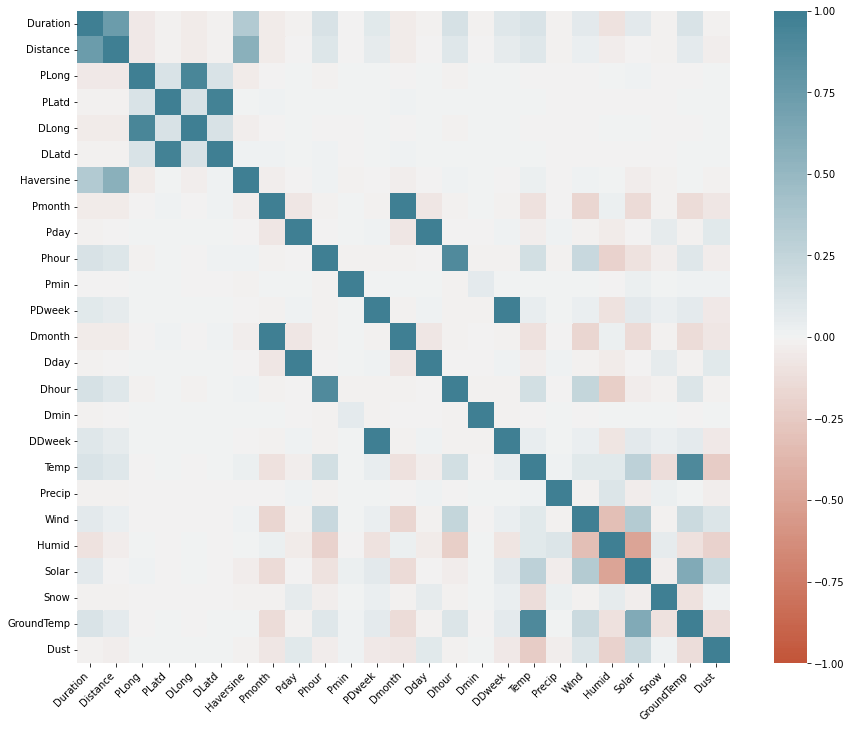

In [47]:
# correlation matrix Using seaborn
plt.figure(figsize=(16,12))
ax = sns.heatmap(corr, vmin=-1, vmax=1, center=0, cmap= sns.diverging_palette(20,220, n=200), square=True)

ax.set_xticklabels(ax.get_xticklabels(), rotation =45, horizontalalignment = 'right');

**Observation from above correlation matrix**
1. distance and duration are strongly related
2. haversine and duration and correlated with each other
3. gound temperature and solar radiation are correlated
4. temperature and solar radiations are correlated
5. phour and dhour are not related to humidity

## SCATTER PLOT

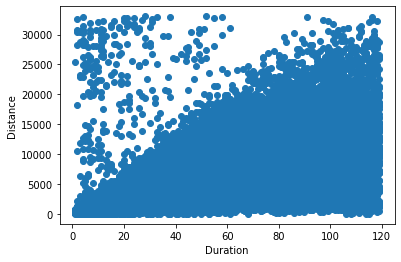

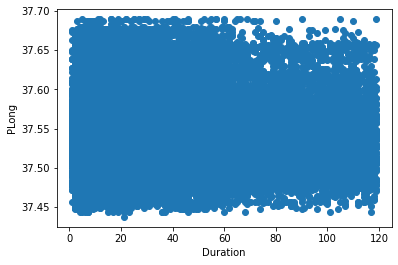

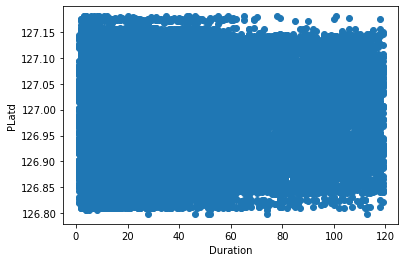

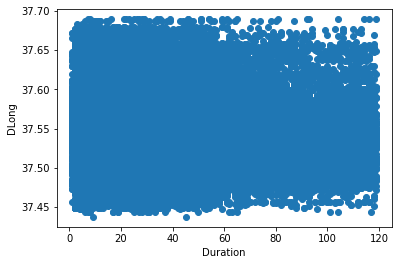

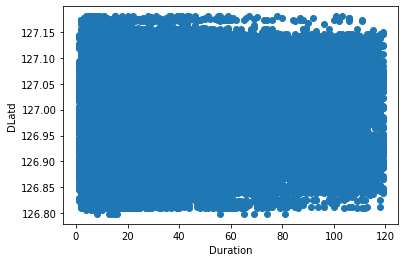

...

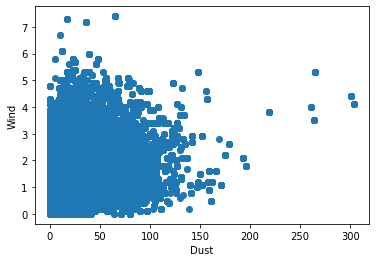

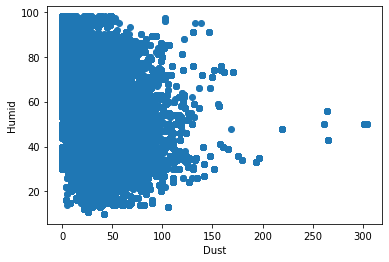

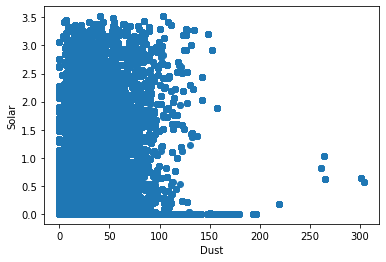

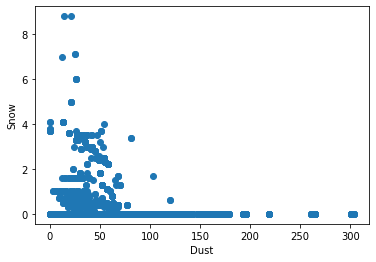

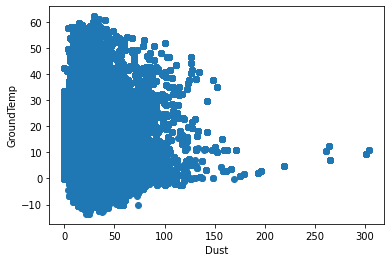

In [48]:
# Function for ploting scatterplot between two columns of dataset

def plot_scatter(x, y):
  plt.figure()
  plt.xlabel(x)
  plt.ylabel(y)
  plt.scatter(all_data[x], all_data[y])
  plt.show()
 
column_list = all_data.columns 
for i in column_list:
  for j in column_list:
    if i != j:
      plot_scatter(i,j)

PLong and DLong are correlated

PLatd and DLatd are correlated

Pmonth and Dmonth are correlated

## HISTOGRAM

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f080ec48190>,
      dtype=object)

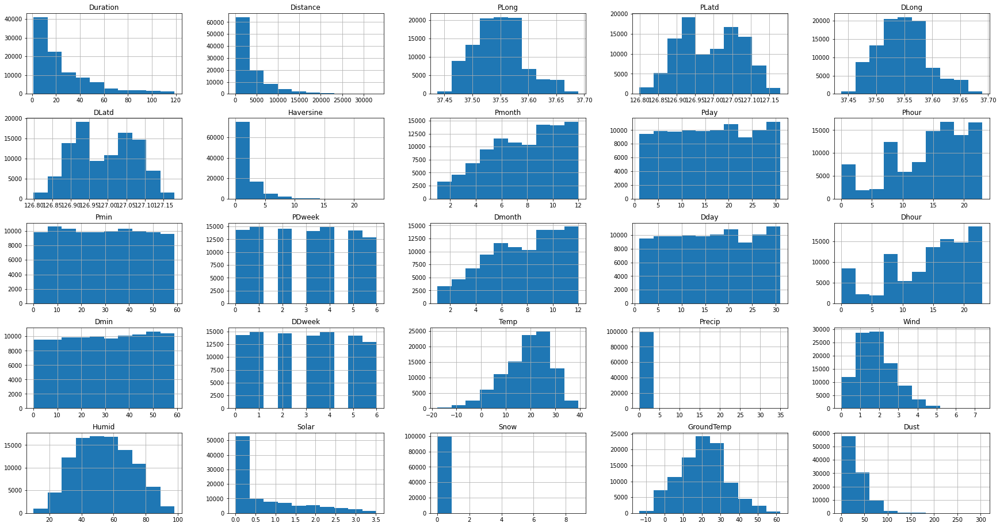

In [49]:
#Histogram Using pandas 


all_data.hist(figsize=(30,16))


Observation -
2. data distribution of duration, distance, haversine, precipation, solar radiation, snow and dust are skewed right.
3. data distribution of humidity is symmetrical
4. data distribution of Pmin and Dmin is right skewed.
4. data distribution of Phour and Dhour is same.
4. data distribution of pday and Dday is same.
4. data distribution of Pmonth and Dmonth is same

## VIF - Variance inflation factor


In [7]:
# importing statsmodle library for vif 

import statsmodels.api as sm

In [8]:
train_for_vif = all_data.drop(columns=['Duration'])


target = all_data['Duration']


names = ['Distance','PLong', 'PLatd', 'DLong', 'DLatd', 'Haversine', 'Pmonth', 'Pday', 'Phour', 'Pmin', 'PDweek','Dmonth', 'Dday', 'Dhour', 'Dmin', 'DDweek', 'Temp', 'Precip', 'Wind', 'Humid', 'Solar', 'Snow', 'GroundTemp', 'Dust']

names

['Distance',
 'PLong',
 'PLatd',
 'DLong',
 'DLatd',
 'Haversine',
 'Pmonth',
 'Pday',
 'Phour',
 'Pmin',
 'PDweek',
 'Dmonth',
 'Dday',
 'Dhour',
 'Dmin',
 'DDweek',
 'Temp',
 'Precip',
 'Wind',
 'Humid',
 'Solar',
 'Snow',
 'GroundTemp',
 'Dust']

In [52]:
# dropping rows with empty cells

train_for_vif.columns == names[1]

array([False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [53]:
train_for_vif

,Distance,PLong,PLatd,DLong,DLatd,Haversine,Pmonth,Pday,Phour,Pmin,...,Dmin,DDweek,Temp,Precip,Wind,Humid,Solar,Snow,GroundTemp,Dust
0,3720,37.613956,127.030251,37.638706,127.015907,3.028153,9,13,3,54,...,15,3,20.9,0.0,1.7,68.0,0.00,0.0,20.0,27.0
1,2970,37.586388,126.935127,37.564541,126.927071,2.530896,11,5,13,45,...,2,0,16.8,0.0,1.1,46.0,1.71,0.0,23.2,58.0
2,980,37.464550,126.883728,37.456841,126.888344,0.949100,11,10,8,50,...,56,5,9.3,0.0,0.3,85.0,0.07,0.0,8.7,83.0
3,980,37.546307,127.049805,37.539654,127.052589,0.779438,8,1,12,17,...,23,2,36.8,0.0,1.3,39.0,2.80,0.0,54.9,37.0
4,8880,37.556610,126.898018,37.556610,126.898018,0.000000,7,27,21,17,...,16,4,30.3,0.0,1.1,75.0,0.00,0.0,30.2,28.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,650,37.528263,126.896629,37.532101,126.894440,0.468391,10,23,23,21,...,26,1,11.2,0.0,0.5,78.0,0.00,0.0,9.0,21.0
99996,2480,37.564674,126.976738,37.544460,126.972389,2.280158,10,7,18,45,...,54,6,17.9,0.0,2.8,29.0,0.16,0.0,14.0,25.0
99997,6750,37.484257,126.954697,37.512959,126.952072,3.199912,5,7,14,52,...,1,0,24.1,0.0,1.2,42.0,1.93,0.0,27.0,67.0
99998,2180,37.600975,126.926956,37.583698,126.924965,1.929110,6,10,15,23,...,38,6,24.8,0.0,1.2,49.0,1.34,0.0,36.6,8.0


In [9]:
# Calculating VIF for each feature.

for i in range(0, len(names)):
  y = train_for_vif.loc[:, train_for_vif.columns==names[i]]
  x = train_for_vif.loc[:, train_for_vif.columns!=names[i]]
  model = sm.OLS(y,x)
  results = model.fit()
  rsq = results.rsquared
  vif = round(1/(1-rsq),2)
  
  print("R Square value of {} columns is {} keeping all other columns as features".format(names[i],(round(rsq, 2))))
  print("Variance inflation Factor of {} columns is {} \n".format(names[i], vif))

R Square value of Distance columns is 0.65 keeping all other columns as features
Variance inflation Factor of Distance columns is 2.88 

R Square value of PLong columns is 1.0 keeping all other columns as features
Variance inflation Factor of PLong columns is 5251100.32 

R Square value of PLatd columns is 1.0 keeping all other columns as features
Variance inflation Factor of PLatd columns is 31246008.28 

R Square value of DLong columns is 1.0 keeping all other columns as features
Variance inflation Factor of DLong columns is 5246653.72 

R Square value of DLatd columns is 1.0 keeping all other columns as features
Variance inflation Factor of DLatd columns is 31196054.28 

R Square value of Haversine columns is 0.65 keeping all other columns as features
Variance inflation Factor of Haversine columns is 2.83 

R Square value of Pmonth columns is 1.0 keeping all other columns as features
Variance inflation Factor of Pmonth columns is 23388.64 

R Square value of Pday columns is 1.0 keep

there is colinearity/multicolinearity between variables as the VIF value is almost upto 2.5

Distance', 'PLong', 'PLatd', 'DLong','DLatd',  'Phour',  'PDweek', 'Dday', 'Dhour', 'Dmin', 'DDweek', 'Temp', 'Precip', 'Humid', 'Solar', 'Snow', 'GroundTemp',  have colinearity with all the variables.

## Box Plot

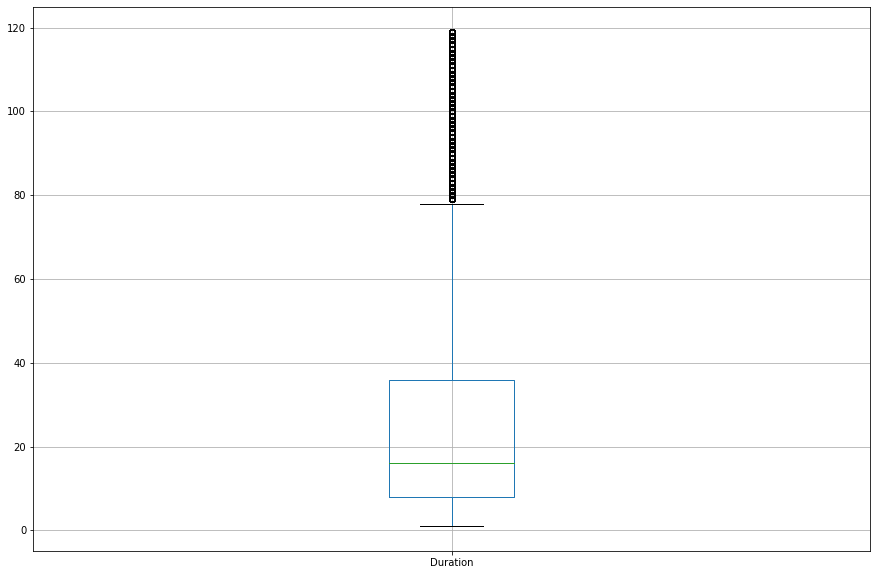

In [55]:
# Performing boxplot on Duration column of the dataset

all_data.boxplot(column='Duration', figsize=(15,10))

from above box plot graph:

duration

25% of duration have value between range 0 to 8

25% of duration have value between range 8 to 18

25% of duration have value between range 18 to 35

25% of duration have value between range 35 to 77

The mean duration is around 18

**Mostly the duration are on the lower side of the spectrum. Means small duration trips are the common trips**


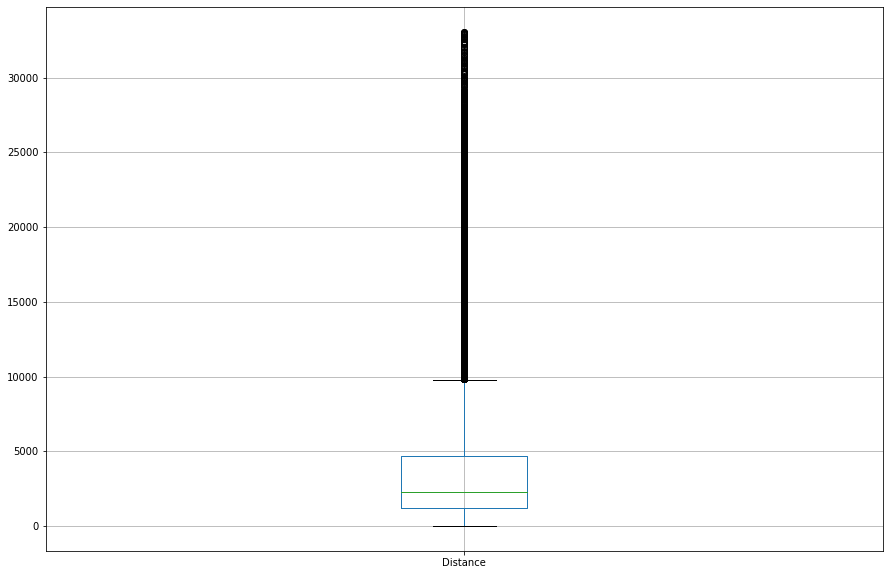

In [56]:
# Performing boxplot on Distance column of the dataset

all_data.boxplot(column='Distance', figsize=(15,10))

from above box plot graph:

distance

25% of distance have value between range 0 to 1000

25% of distance have value between range 1000 to 2500

25% of distance have value between range 2500 to 4900

25% of distance have value between range 4900 to 9900

The mean distance is around 2500

 Mostly the distance are on the lower side of the spectrum. Means small distance trips are the common trips



In [57]:
# Perform boxplot on PLong column of the dataset


from above box plot graph:

PLong

25% of PLong have value between range 37.44 to 37.52

25% of PLong have value between range 37.52 to 37.559

25% of PLong have value between range 37.559 to 37.58

25% of PLong have value between range 37.58 to 37.66

The mean PLong is around 37.559

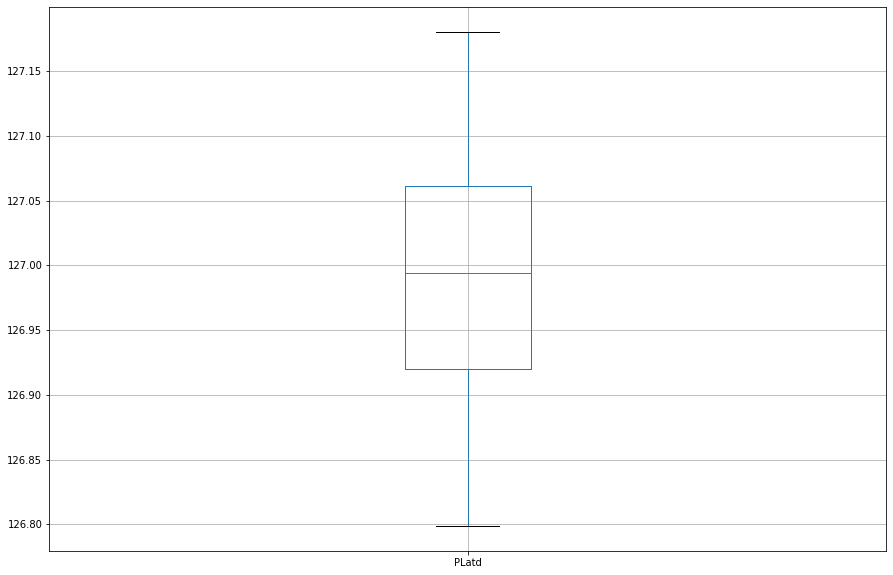

In [58]:
# Performing boxplot on PLatd column of the dataset

all_data.boxplot(column='PLatd', figsize=(15,10))

from above box plot graph:

PLatd

25% of PLatd have value between range 126.80 to 162.92

25% of PLatd have value between range 126.92 to 126.99

25% of PLatd have value between range 126.99 to 127.07

25% of PLatd have value between range 127.07 to 127.18

The mean PLatd is around 126.99

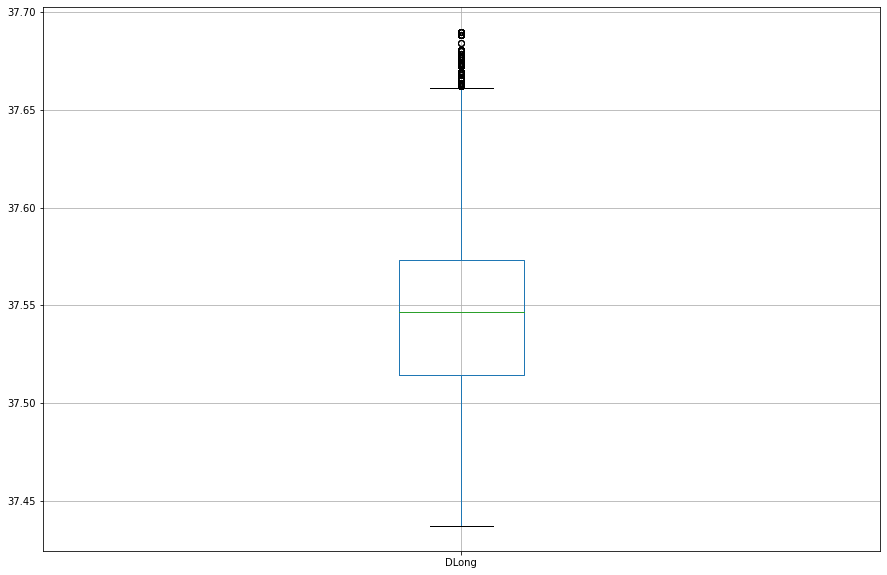

In [59]:
# Performing boxplot on DLong column of the dataset

all_data.boxplot(column='DLong', figsize=(15,10))

from above box plot graph:

DLong

25% of DLong have value between range 37.43 to 37.52

25% of DLong have value between range 37.52 to 37.545

25% of DLong have value between range 37.545 to 37.575

25% of DLong have value between range 37.575 to 37.665

The mean DLong is around 37.545

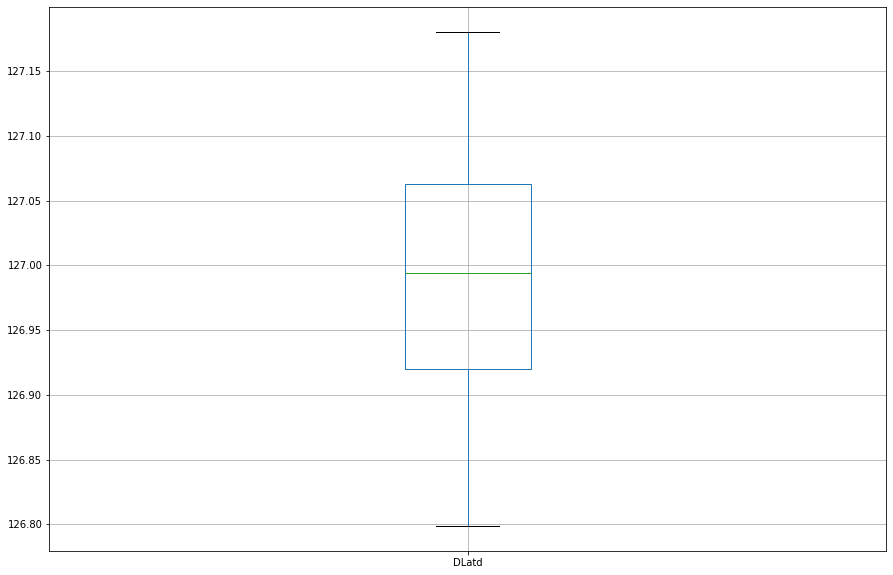

In [60]:
# Performing boxplot on DLatd column of the dataset

all_data.boxplot(column='DLatd', figsize=(15,10))

from above box plot graph:

DLatd

25% of DLatd have value between range 126.80 to 126.92

25% of DLatd have value between range 126.92 to 126.995

25% of DLatd have value between range 126.995 to 127.055

25% of DLatd have value between range 127.055 to 127.175

The mean DLatd is around 126.995

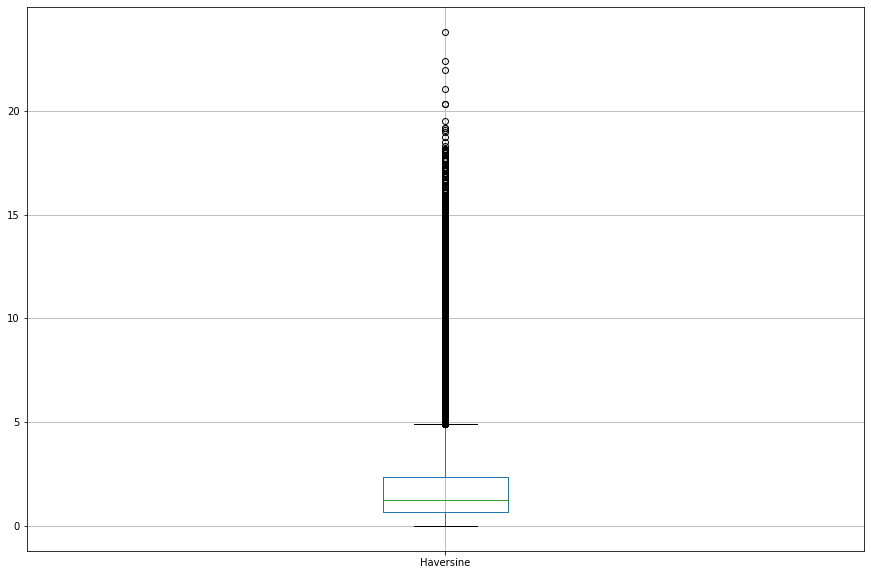

In [61]:
# Performing boxplot on Haversine column of the dataset

all_data.boxplot(column='Haversine', figsize=(15,10))

from above box plot graph:

haversine

25% of haversine have value between range 0 to 0.25

25% of haversine have value between range 0.25 to 1

25% of haversine have value between range 1 to 2.5

25% of haversine have value between range 2.5 to 5

The mean haversine is around 1

Observation: Mostly the haversine are on the lower side of the spectrum. Means small distance trips are the common trips

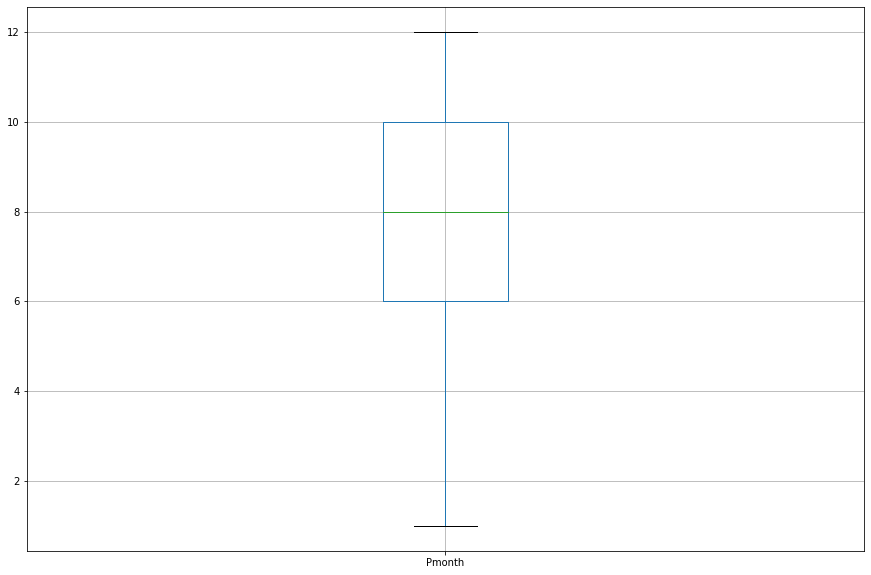

In [63]:
# Performing boxplot on pmonth column of the dataset

all_data.boxplot(column='Pmonth', figsize=(15,10))

from above box plot graph:

Pmonth

25% of Pmonth have value between range 1 to 6

25% of Pmonth have value between range 6 to 8

25% of Pmonth have value between range 8 to 10

25% of Pmonth have value between range 10 to 12

The mean Pmonth is around 8

more pickups are in the month which are at the end of the year

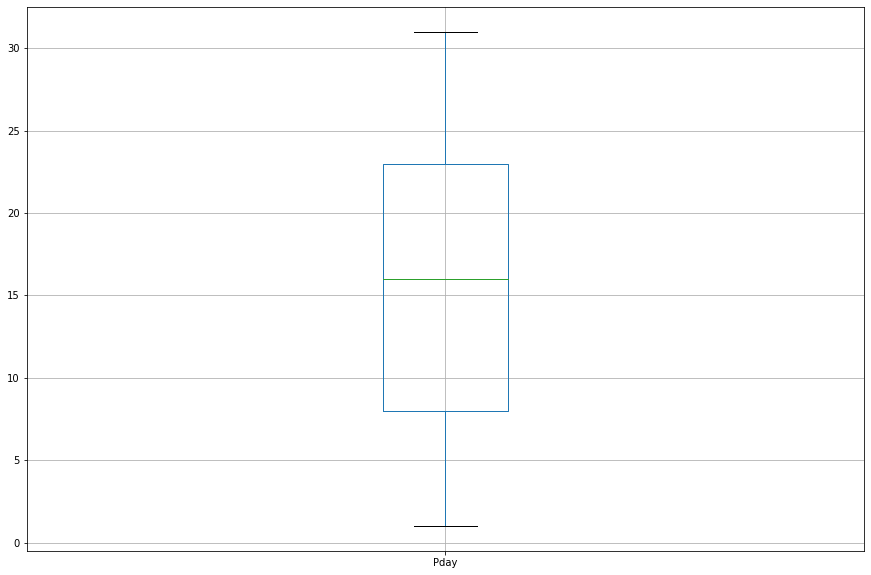

In [64]:
# Performing boxplot on Pday column of the dataset

all_data.boxplot(column='Pday', figsize=(15,10))

from above box plot graph:

Pday

25% of Pday have value between range 1 to 8

25% of Pday have value between range 8 to 16

25% of Pday have value between range 16 to 23

25% of Pday have value between range 23 to 31

The mean Pday is around 16

pickups are almost same on every day of month

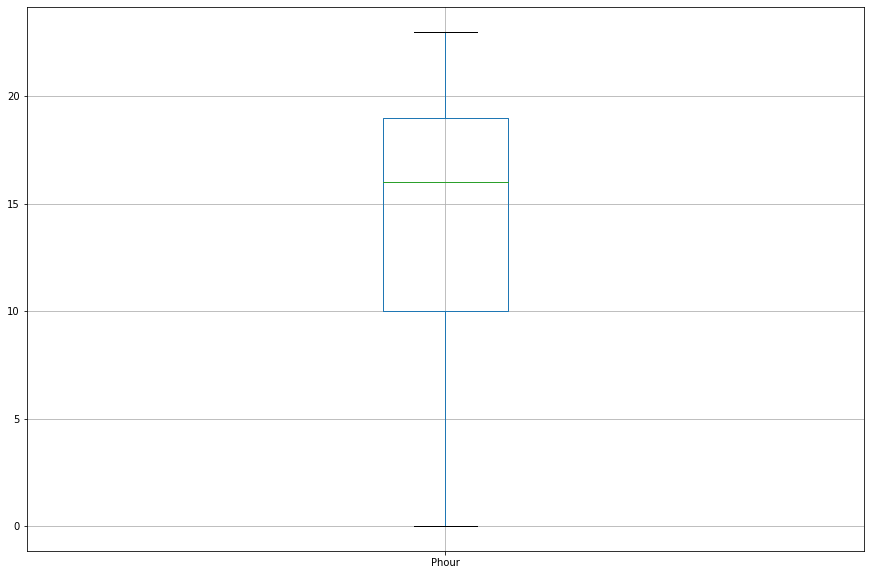

In [65]:
# Performing boxplot on Phour column of the dataset

all_data.boxplot(column='Phour', figsize=(15,10))

from above box plot graph:

Phour

25% of Phour have value between range 0 to 10

25% of Phour have value between range 10 to 16

25% of Phour have value between range 16 to 19

25% of Phour have value between range 19 to 24

The mean Phour is around 16

more pickups are towards the end of the day

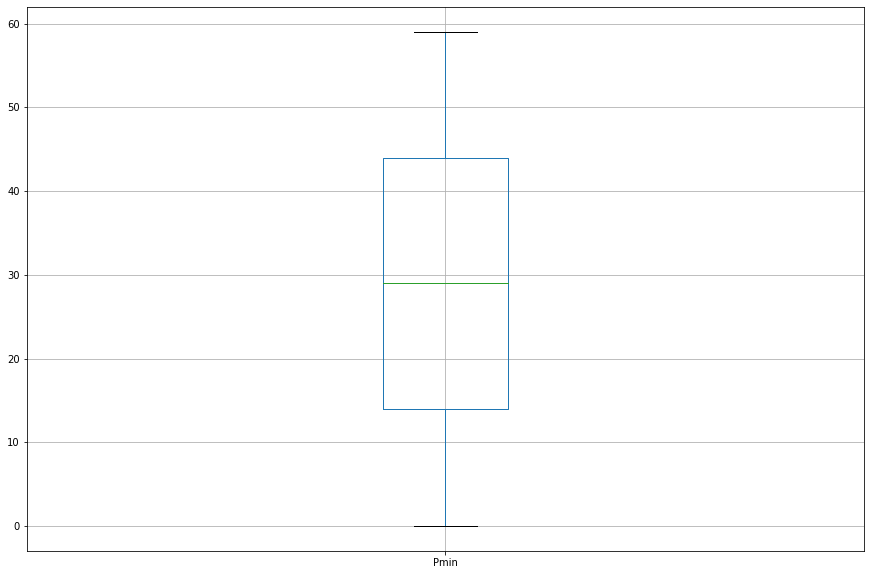

In [66]:
# Performing boxplot on Pmin column of the dataset

all_data.boxplot(column='Pmin', figsize=(15,10))

from above box plot graph:

Pmin

25% of Pmin have value between range 0 to 14

25% of Pmin have value between range 14 to 29

25% of Pmin have value between range 29 to 44

25% of Pmin have value between range 44 to 60

The mean Pmin is around 29

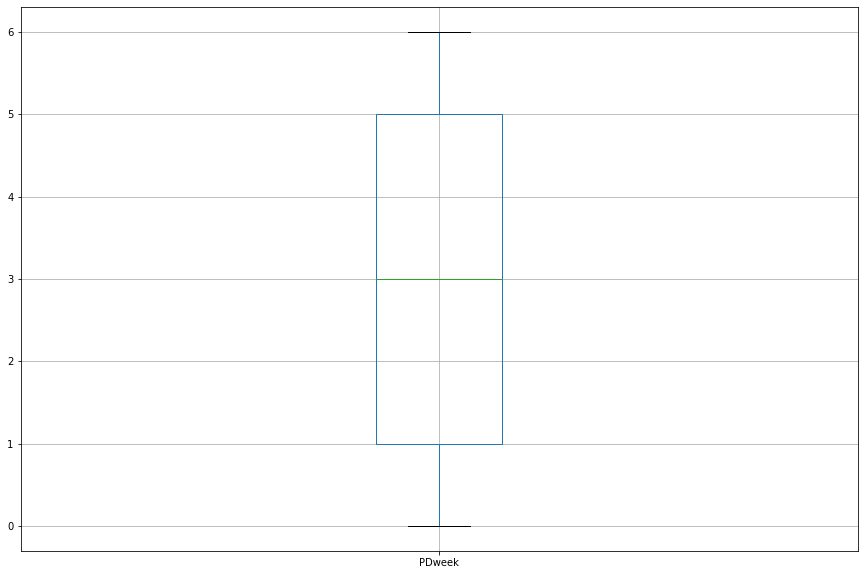

In [67]:
# Performing boxplot on PDweek column of the dataset 

all_data.boxplot(column='PDweek', figsize=(15,10))

from above box plot graph:

PDweek

25% of PDweek have value between range 0 to 1

25% of PDweek have value between range 1 to 3

25% of PDweek have value between range 3 to 5

25% of PDweek have value between range 3 to 6

The mean PDweek is around 3

equal pickups throughout the week

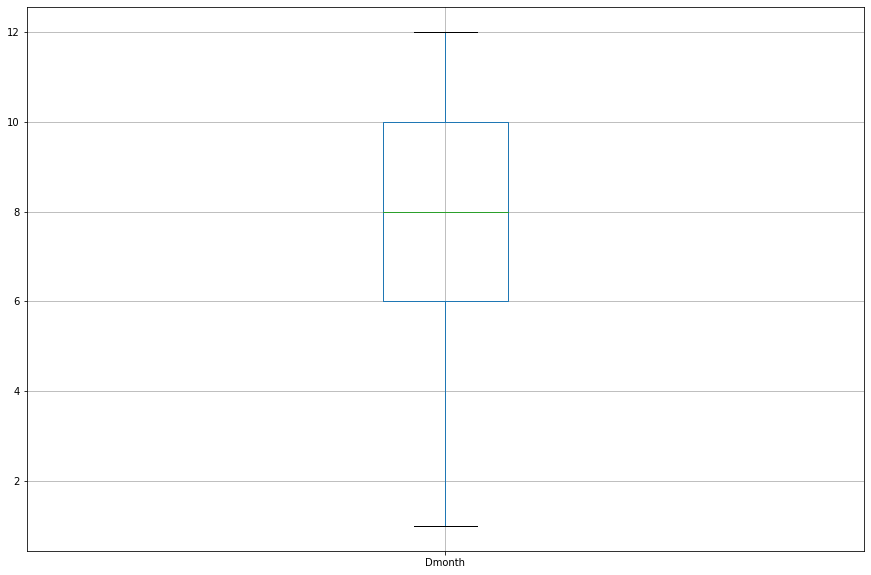

In [68]:
# Performing boxplot on Dmonth column of the dataset

all_data.boxplot(column='Dmonth', figsize=(15,10))

from above box plot graph:

Dmonth

25% of Dmonth have value between range 1 to 6

25% of Dmonth have value between range 6 to 8

25% of Dmonth have value between range 8 to 10

25% of Dmonth have value between range 10 to 12

The mean Dmonth is around 8

more drop offs are towords the end months of the year

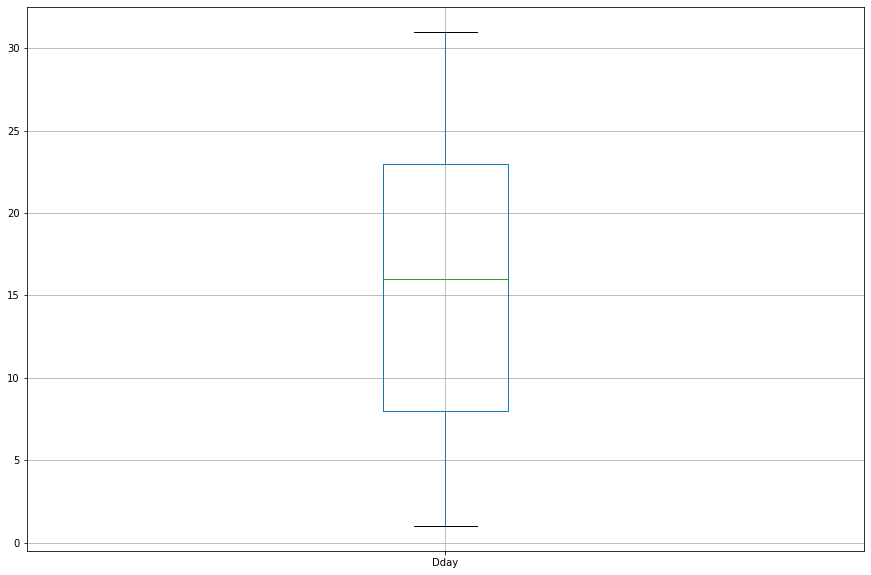

In [69]:
# Performing boxplot on Dday column of the dataset 

all_data.boxplot(column='Dday', figsize=(15,10))

from above box plot graph:

Dday

25% of Dday have value between range 1 to 8

25% of Dday have value between range 8 to 16

25% of Dday have value between range 16 to 23

25% of Dday have value between range 23 to 31

The mean Dday is around 16

drops the equal throughout all the days of month

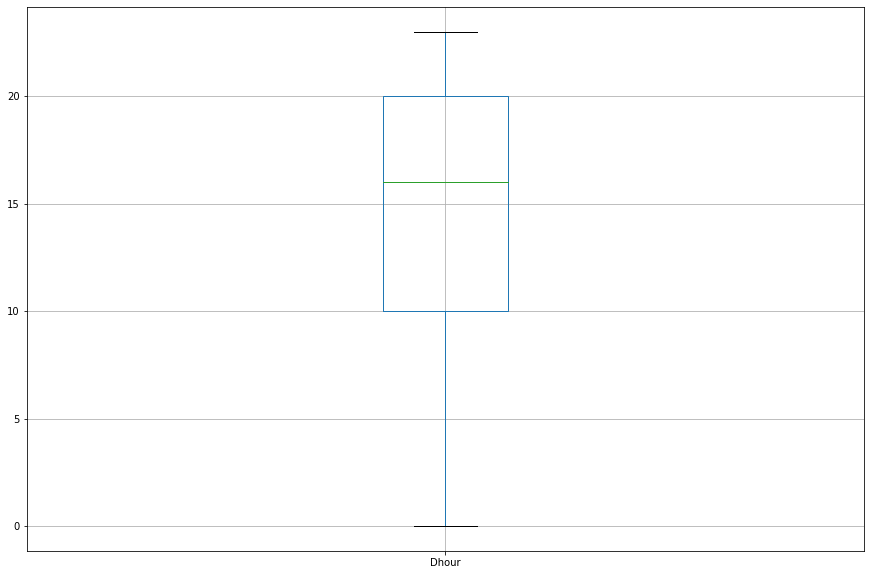

In [70]:
# Performing boxplot on Dhour column of the dataset

all_data.boxplot(column='Dhour', figsize=(15,10))

from above box plot graph:

Dhour

25% of Dhour have value between range 0 to 10

25% of Dhour have value between range 10 to 16

25% of Dhour have value between range 16 to 20

25% of Dhour have value between range 20 to 24

The mean Dhour is around 16

drops offs are more towards the end hours of the day

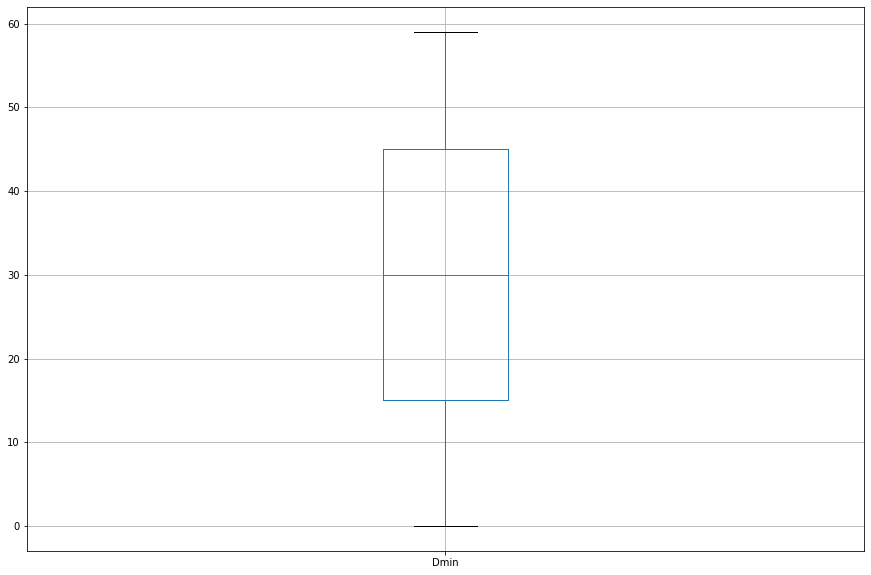

In [71]:
# Performing boxplot on Dmin column of the dataset

all_data.boxplot(column='Dmin', figsize=(15,10))

from above box plot graph:

Dmin

25% of Dmin have value between range 0 to 15

25% of Dmin have value between range 15 to 30

25% of Dmin have value between range 30 to 45

25% of Dmin have value between range 45 to 60

The mean Dmin is around 30

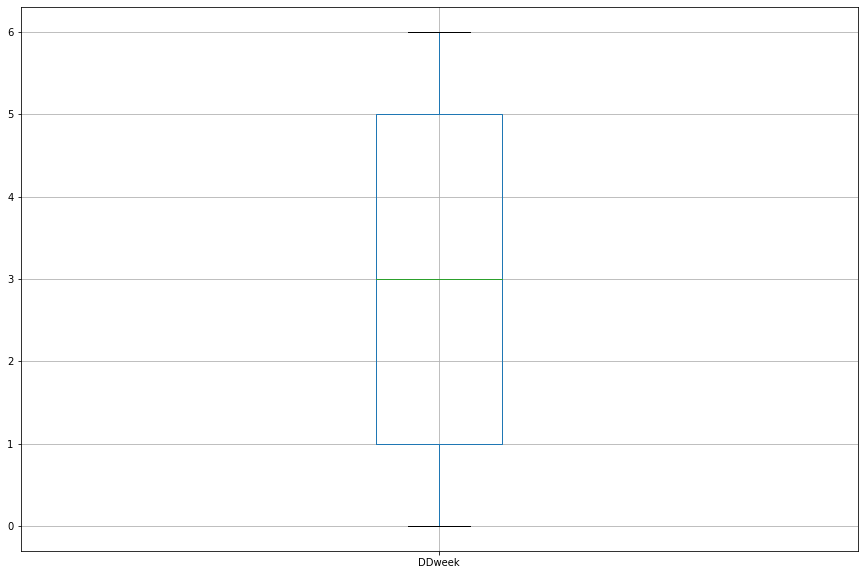

In [72]:
# Performing boxplot on DDweek column of the dataset

all_data.boxplot(column='DDweek', figsize=(15,10))

from above box plot graph:

DDweek

25% of DDweek have value between range 0 to 1

25% of DDweek have value between range 1 to 3

25% of DDweek have value between range 3 to 5

25% of DDweek have value between range 5 to 6

The mean DDweek is around 3

drops are equal throughout the week

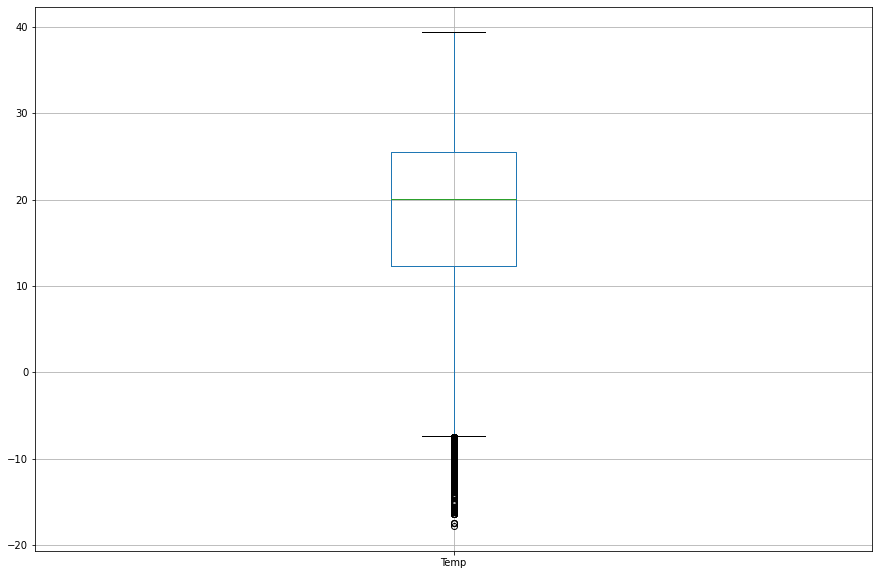

In [73]:
# Performing boxplot on Temp column of the dataset

all_data.boxplot(column='Temp', figsize=(15,10))

from above box plot graph:

temperature

25% of temperature have value between range -8 to 2

25% of temperature have value between range 2 to 20

25% of temperature have value between range 20 to 26

25% of temperature have value between range 26 to 40

The mean temperature is around 20

trips are planned in slightly high temperature

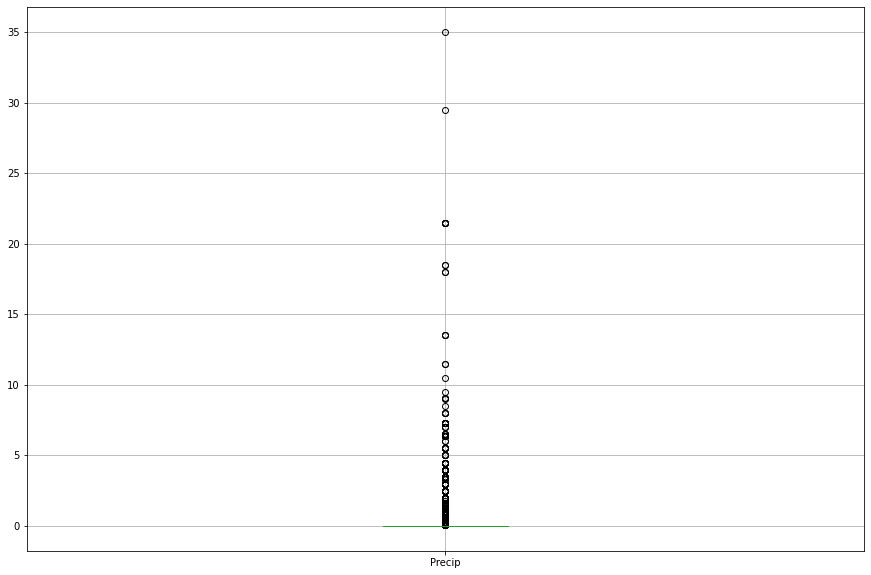

In [74]:
# Perform boxplot on Precip column of the dataset


all_data.boxplot(column='Precip', figsize=(15,10))

from above box plot graph:

precip

25% of precip have value between range 0 to 0

25% of precip have value between range 0 to 0

25% of precip have value between range 0 to 0

25% of precip have value between range 0 to 0

The mean precip is around 0

more trips are planned when there is no rain or snow fall

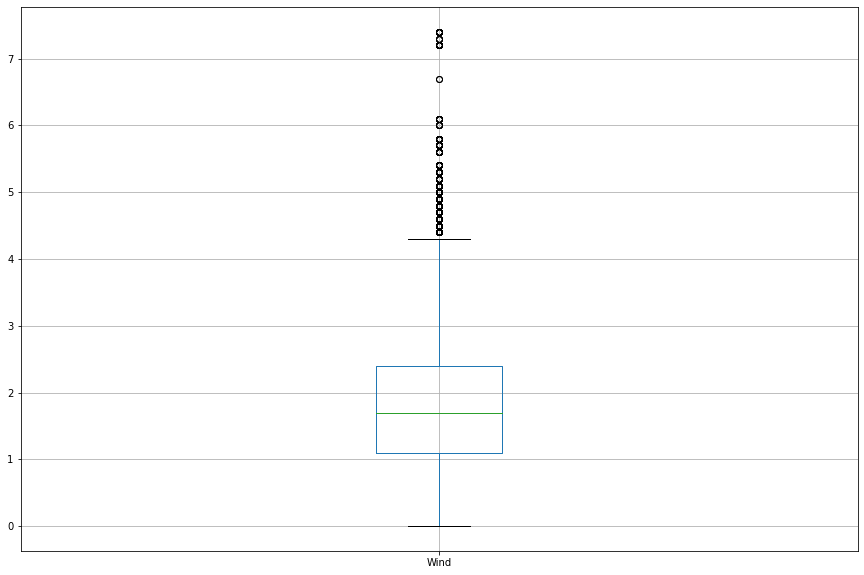

In [75]:
# Performing boxplot on Wind column of the dataset

all_data.boxplot(column='Wind', figsize=(15,10))

from above box plot graph:

wind

25% of wind have value between range 0 to 1.1

25% of wind have value between range 1.1 to 1.8

25% of wind have value between range 1.8 to 2.5

25% of wind have value between range 2.5 to 4.2

The mean wind is around 1.8

more trips are during less windy wheather

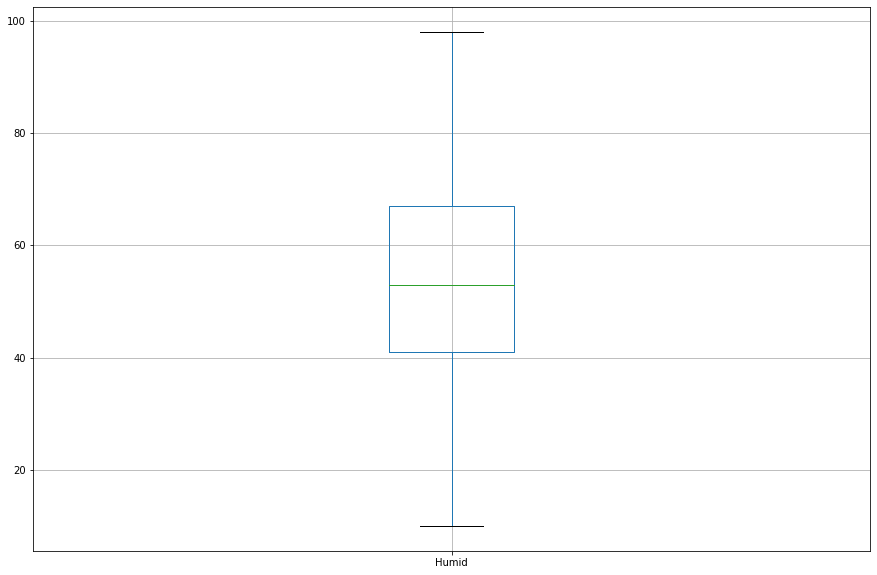

In [76]:
# Performing boxplot on Humid column of the dataset

all_data.boxplot(column='Humid', figsize=(15,10))

from above box plot graph:

humid

25% of humid have value between range 10 to 41

25% of humid have value between range 41 to 56

25% of humid have value between range 56 to 64

25% of humid have value between range 64 to 99

The mean humid is around 56

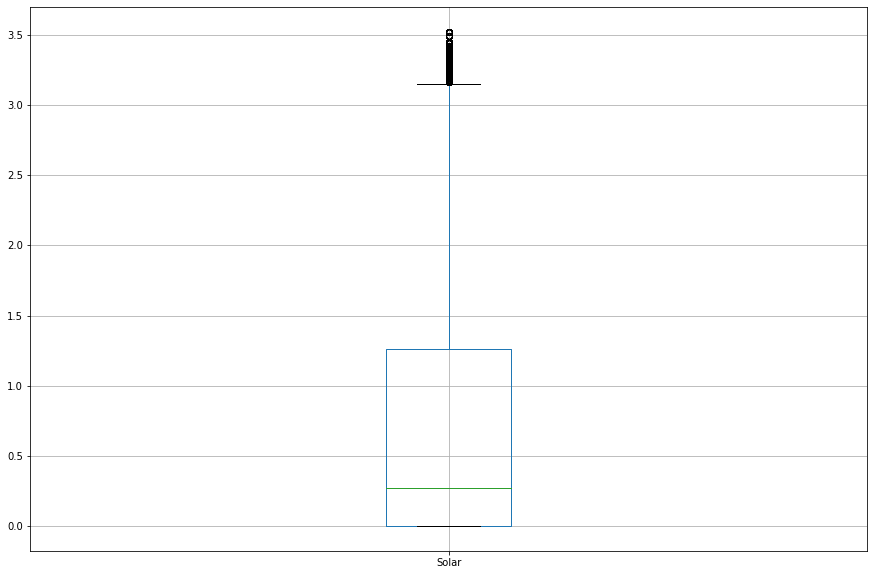

In [77]:
# Performing boxplot on Solar column of the dataset 

all_data.boxplot(column='Solar', figsize=(15,10))

from above box plot graph:

solar

25% of solar have value between range 0 to 0

25% of solar have value between range 0 to 0.25

25% of solar have value between range 0.25 to 1.25

25% of solar have value between range 1.25 to 3.1

The mean solar is around 0.25

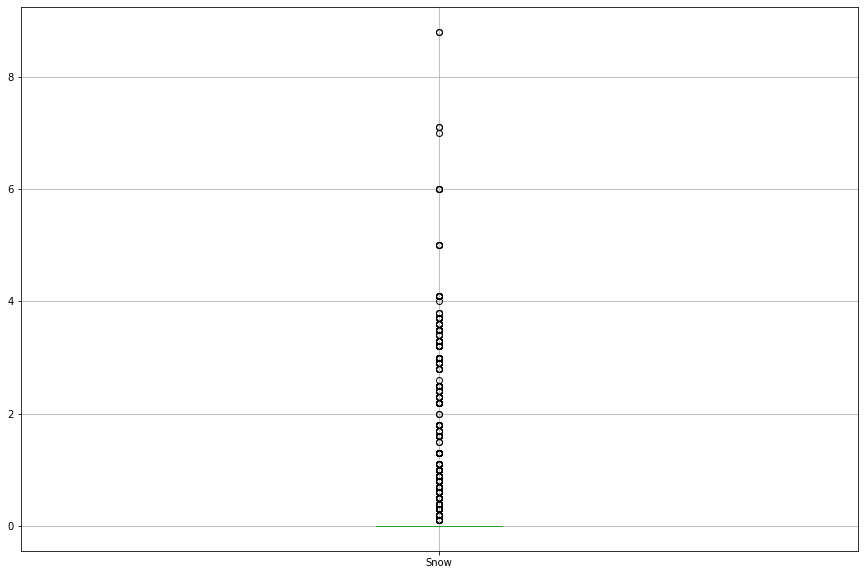

In [78]:
# Performing boxplot on Snow column of the dataset 

all_data.boxplot(column='Snow', figsize=(15,10))

from above box plot graph:

snow

25% of snow have value between range 0 to 0

25% of snow have value between range 0 to 0

25% of snow have value between range 0 to 0

25% of snow have value between range 0 to 0

The mean snow is around 0

more trips are during when there is no snow fall

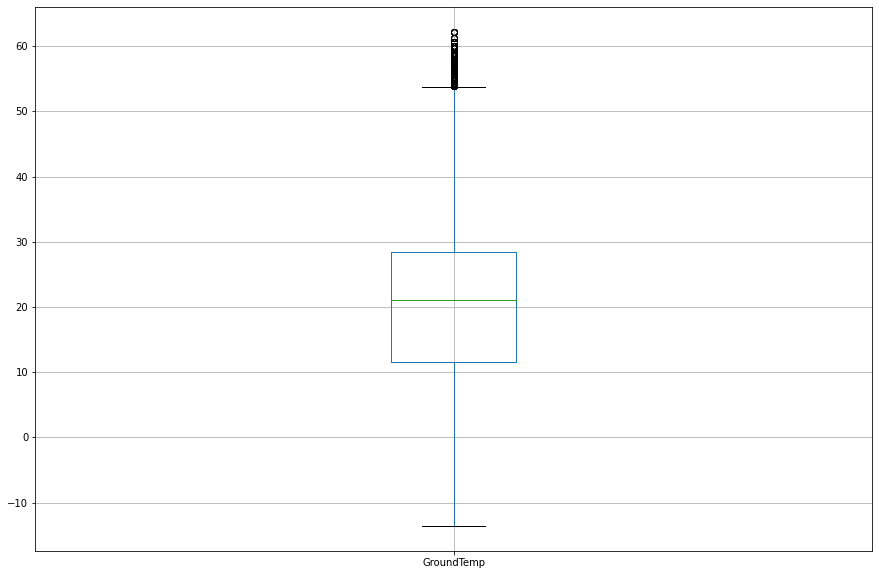

In [79]:
# Performing boxplot on GroundTemp column of the dataset

all_data.boxplot(column='GroundTemp', figsize=(15,10))

from above box plot graph:

groundtemperature

25% of groundtemperature have value between range -12 to 11

25% of groundtemperature have value between range 11 to 21

25% of groundtemperature have value between range 21 to 29

25% of groundtemperature have value between range 29 to 52

The mean groundtemperature is around 21

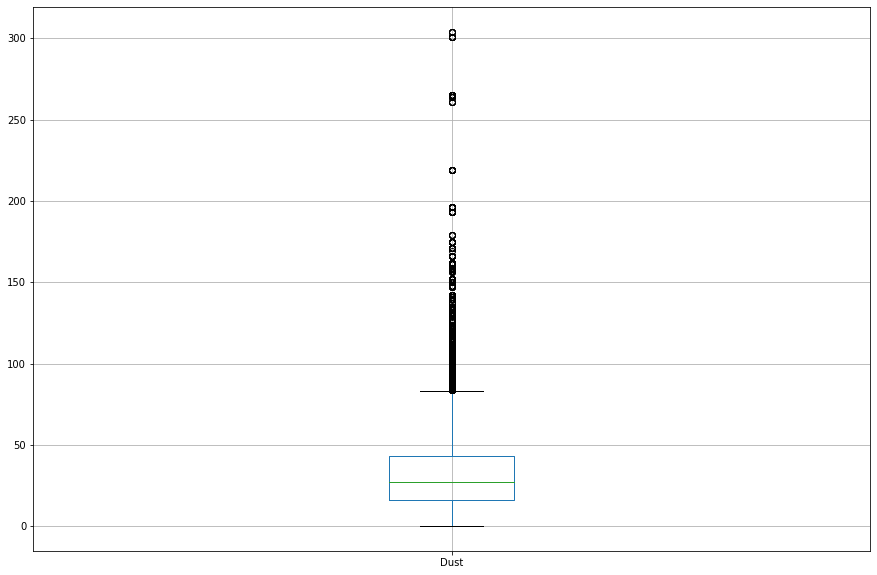

In [80]:
# Performing boxplot on dust column of the dataset

all_data.boxplot(column='Dust', figsize=(15,10))

from above box plot graph:

dust

25% of dust have value between range 0 to 20

25% of dust have value between range 20 to 30

25% of dust have value between range 30 to 45

25% of dust have value between range 45 to 80

The mean dust is around 30

Observation: Mostly the dust are on the lower side of the spectrum. Means people preffer to travel in less dust concentration

## POINT PLOT

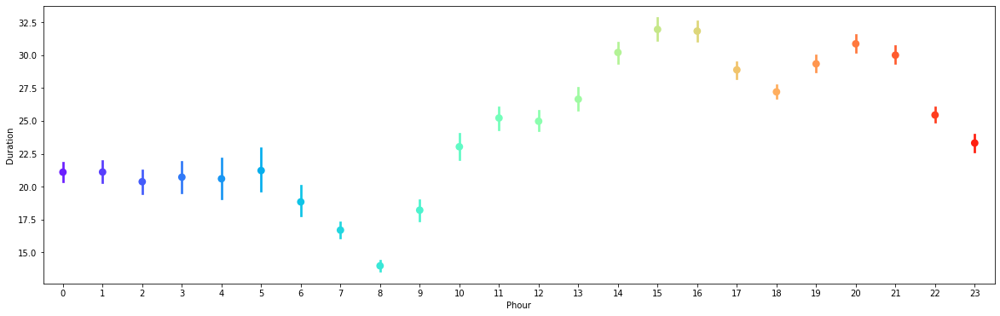

In [81]:
# Performing point plot between Phour and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Phour', y ='Duration', data=all_data, palette='rainbow')

duration is more during morning and evening

after 8 duration is increasing and after 20 its again decreasing

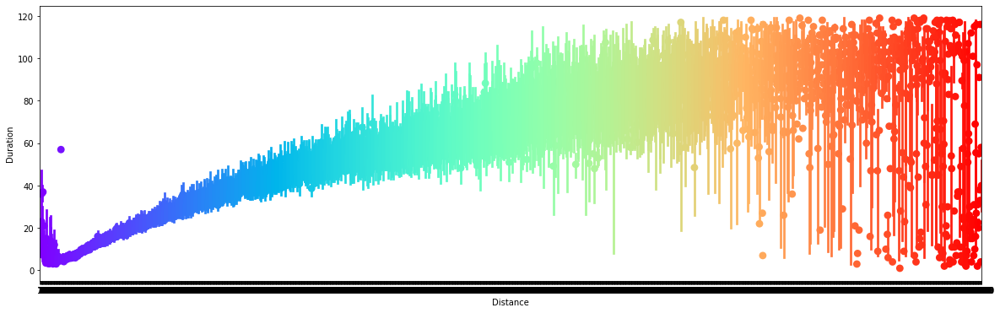

In [82]:
# Performing point plot between Distance and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Distance', y ='Duration', data=all_data, palette='rainbow')

duration and distance have a positive correlation between them



as duration increases distance also increases

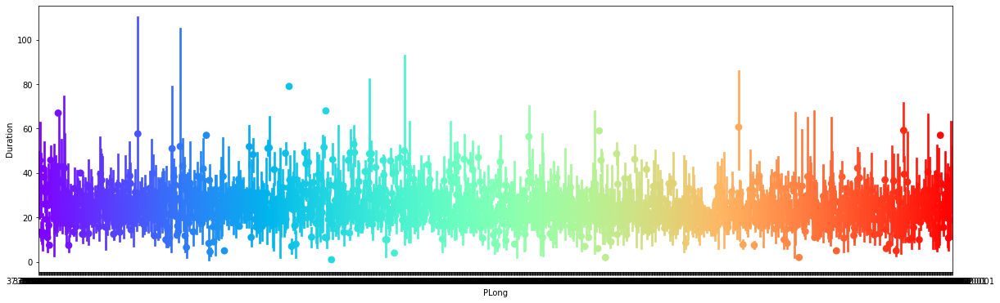

In [83]:
# Performing point plot between PLong and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='Duration', data=all_data, palette='rainbow')

as duration  increases  pickup longitude decreases

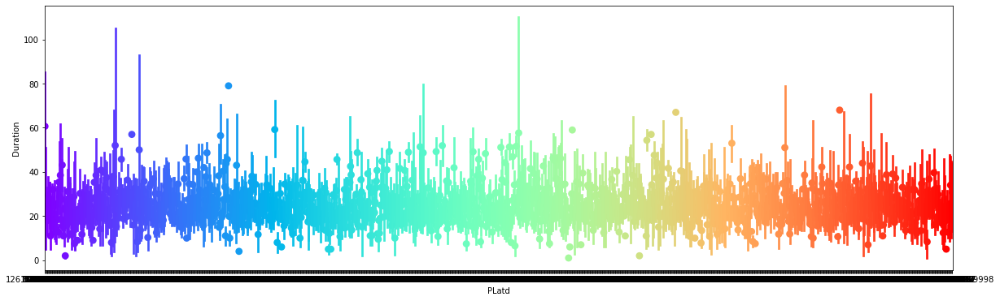

In [84]:
# Perform point plot between PLatd and Duration values 


plt.figure(figsize=(20,6))

sns.pointplot(x='PLatd', y ='Duration', data=all_data, palette='rainbow')

duration and PLatd has negative correlation between them.

as the value of duration increases value of PLatd decreases

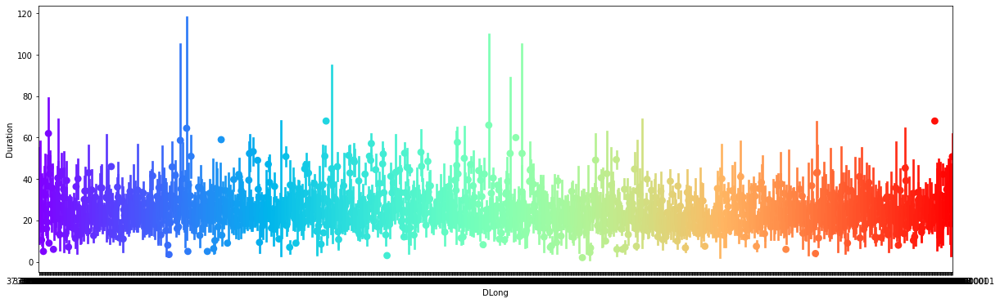

In [85]:
# Performing point plot between DLong and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='DLong', y ='Duration', data=all_data, palette='rainbow')

duration and DLong has negative correlation between them.

as the value of duration increases value of DLong decreases

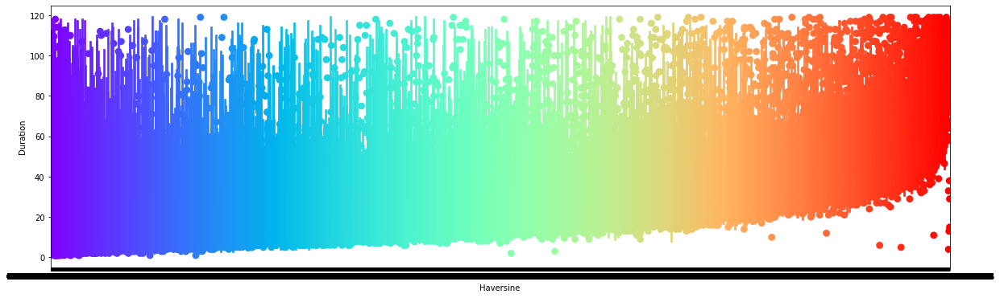

In [86]:
# Performing point plot between haversine and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Haversine', y ='Duration', data=all_data, palette='rainbow')

duration and haversine are correlated 

they have positive correlation between them

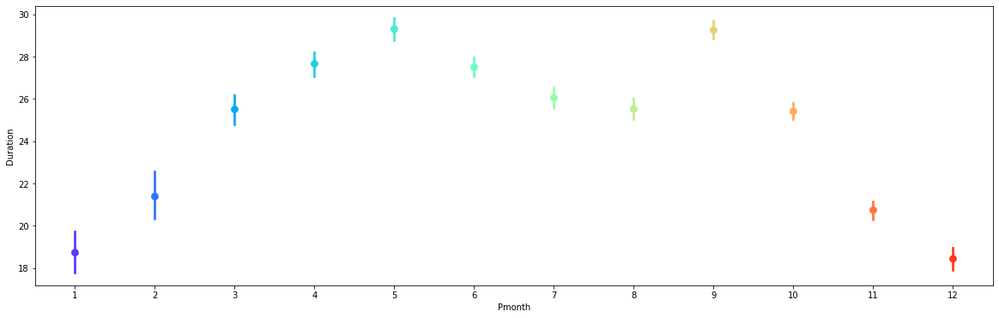

In [87]:
# Performing point plot between Pmonth and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Pmonth', y ='Duration', data=all_data, palette='rainbow')

pmonth and duration are positively correlated

as the value of duration increases value of Pmonth also increases






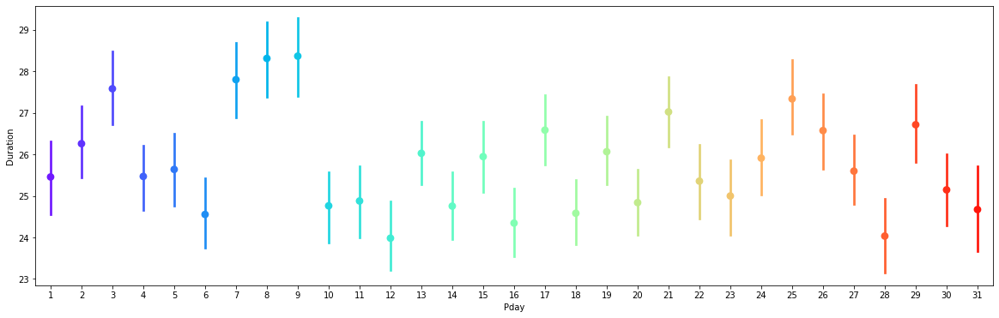

In [88]:
# Performing point plot between Pday and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Pday', y ='Duration', data=all_data, palette='rainbow')

most of the points are between 14.0 and 15.0

very few are above 15,0 and below 14.0

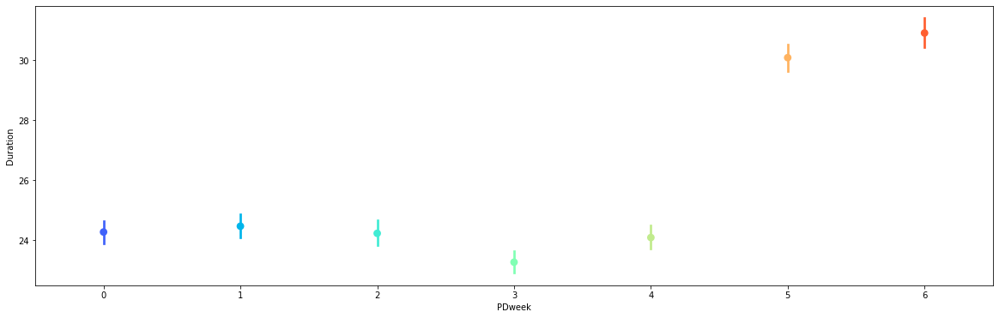

In [89]:
# Performing point plot between PDweek and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PDweek', y ='Duration', data=all_data, palette='rainbow')

Duration has a positive correlation with PDweek

as the value of duration increasing value of PDweek is also increasing

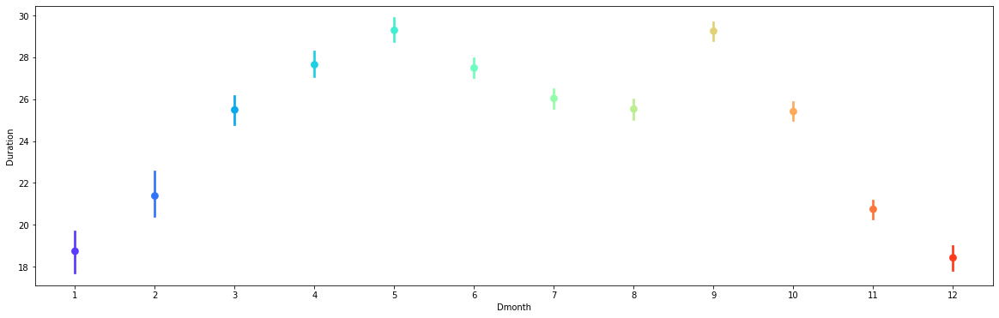

In [90]:
# Performing point plot between Dmonth and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Dmonth', y ='Duration', data=all_data, palette='rainbow')

all values are between 7.5 and 7.8 

there is no relation between Dmonth and Duration

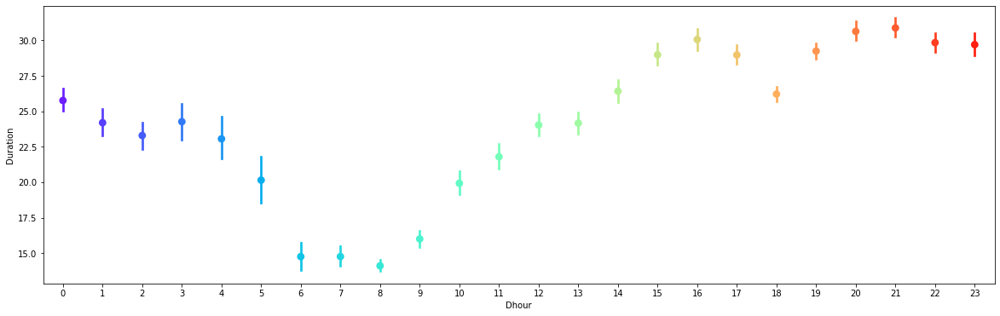

In [91]:
# Performing point plot between Dhour and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Dhour', y ='Duration', data=all_data, palette='rainbow')

there is a positive relation between duration and Dhour 

as the value of duration increases value of Dhour also increases

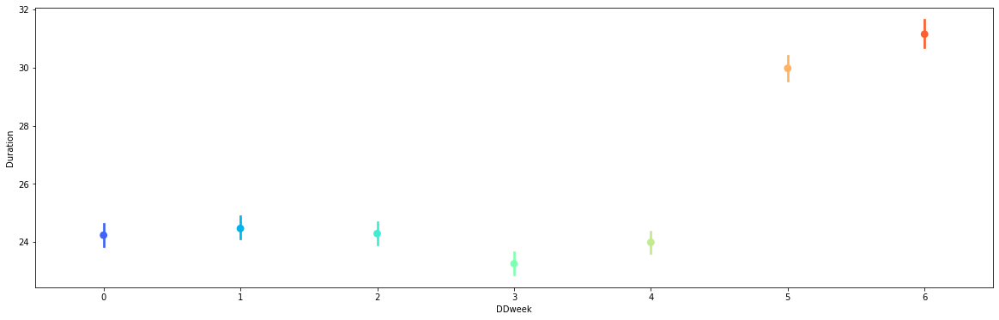

In [92]:
# Performing point plot between DDweek and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='DDweek', y ='Duration', data=all_data, palette='rainbow')

there is increase in DDweek when there is increase in duration

they are correlated to each other

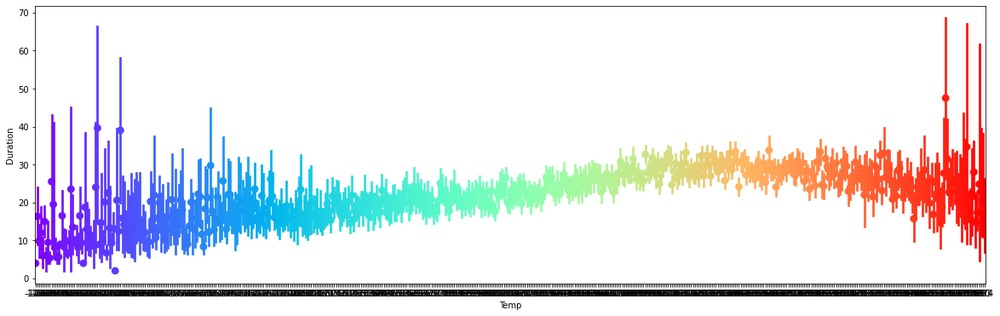

In [93]:
# Performing point plot between Temp and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Temp', y ='Duration', data=all_data, palette='rainbow')

duration and templerature have a positive relation between them


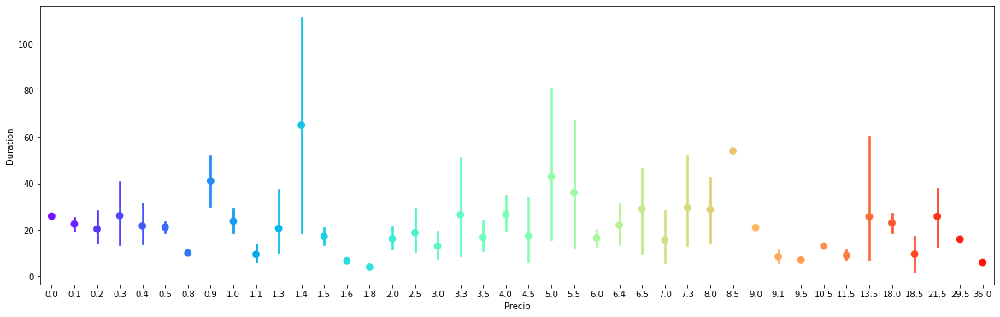

In [94]:
# Performing point plot between Precip and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Precip', y ='Duration', data=all_data, palette='rainbow')

most of the values are between 0.0 and 0.01

very few values are above 0.01

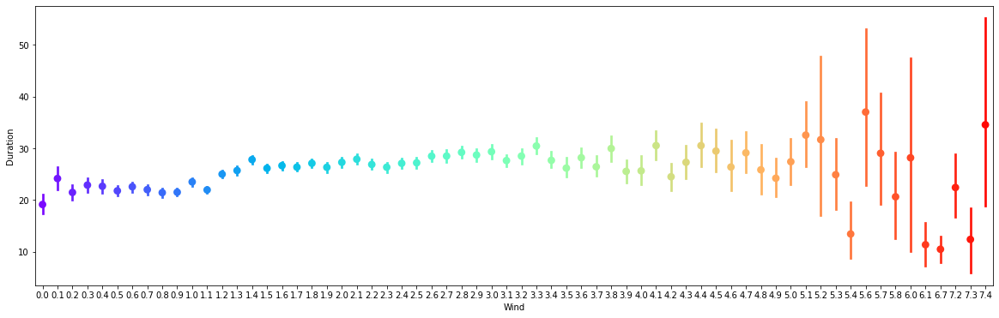

In [95]:
# Performing point plot between Wind and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Wind', y ='Duration', data=all_data, palette='rainbow')

duration and wind are correlated 

as the value of duration increases value of wind is also increasing

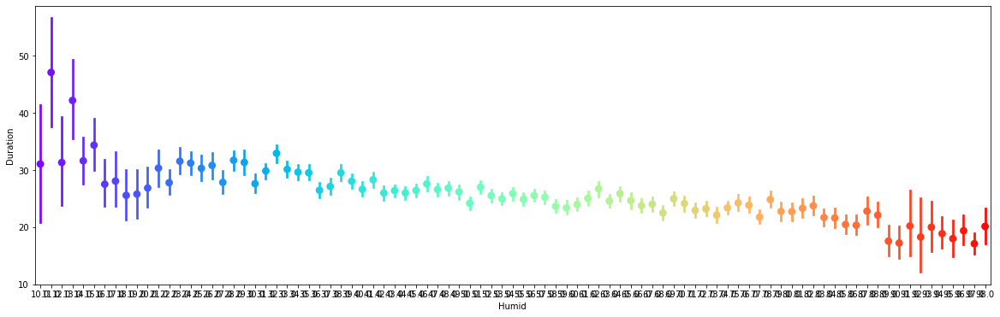

In [96]:
# Perform point plot between Humid and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Humid', y ='Duration', data=all_data, palette='rainbow')

duration and humidity are negatively correlated 

as the value of duration is increasing value of humidity decreases

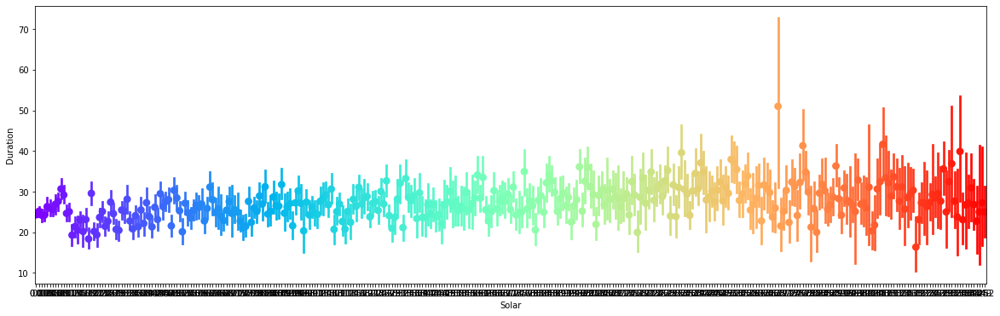

In [97]:
# Performing point plot between Solar and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Solar', y ='Duration', data=all_data, palette='rainbow')

as the value of duration is increasing value of solar radiations is also increasing

they are correlated to each other

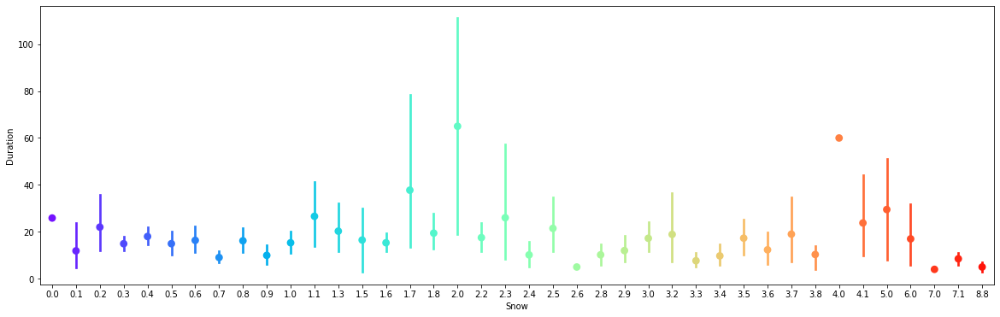

In [98]:
# Performing point plot between Snow and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Snow', y ='Duration', data=all_data, palette='rainbow')

snow and duration are correlated 

they have negative relation between them

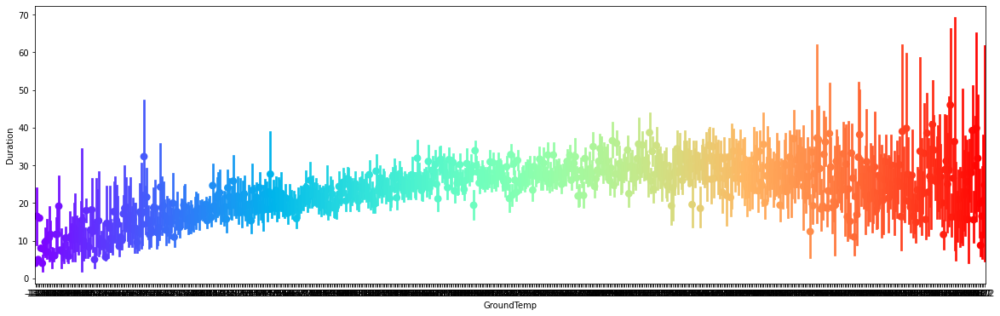

In [99]:
# Performing point plot between GroundTemp and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='GroundTemp', y ='Duration', data=all_data, palette='rainbow')

ground temperature and duration are correlated to each other.

as the value of duration increases value of ground temperature also increases

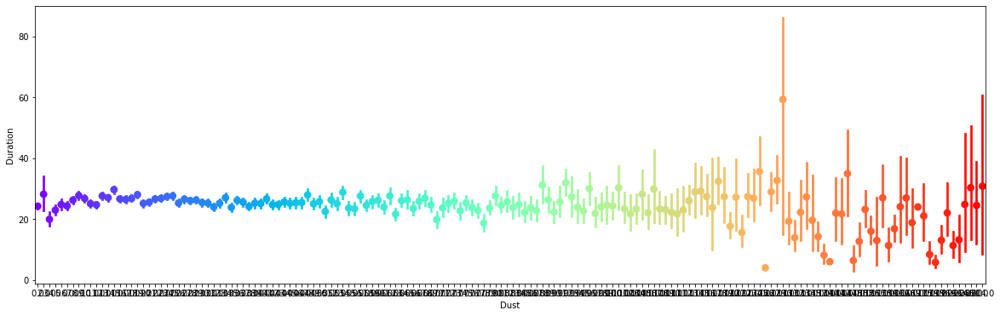

In [100]:
# Performing point plot between Dust and Duration values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Dust', y ='Duration', data=all_data, palette='rainbow')

dust and duration are correlated to each other.

as the value of duration increases value of dust also increases

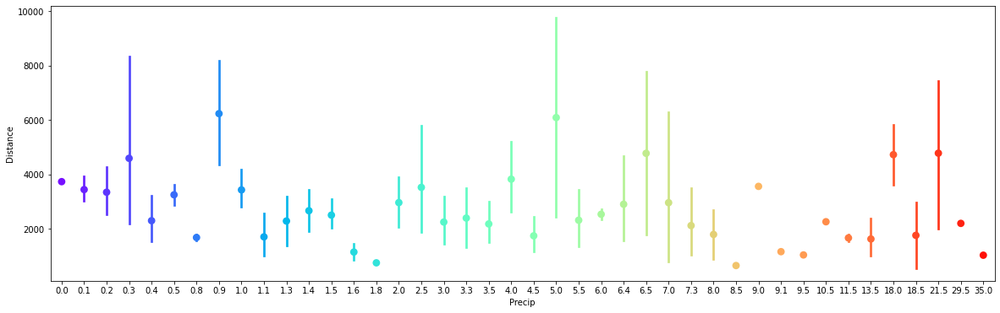

In [101]:
# Performing point plot between Precip and Distance values 

plt.figure(figsize=(20,6))

sns.pointplot(x='Precip', y ='Distance', data=all_data, palette='rainbow')

all the values are around 0.00

very few are above 0.00

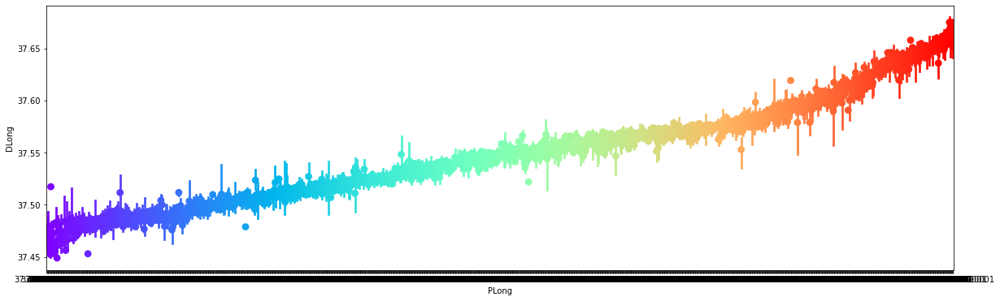

In [102]:
# Performing point plot between PLong and Dlong values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='DLong', data=all_data, palette='rainbow')

Plong and Dlong are corelated

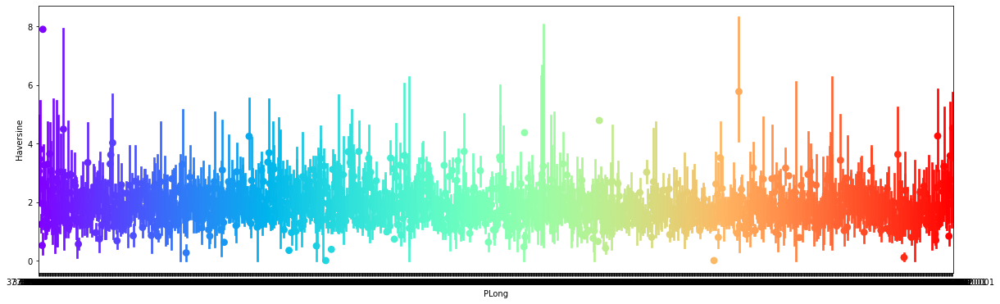

In [103]:
# Performing point plot between PLong and Haversine values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='Haversine', data=all_data, palette='rainbow')

all the values are between 1 and 3

very few are above 3 and below 1

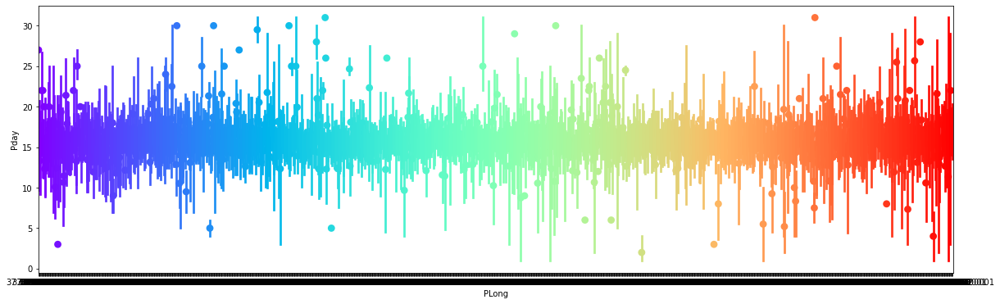

In [104]:
# Performing point plot between PLong and Pday values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='Pday', data=all_data, palette='rainbow')

all the values are between 12.5 to 17.5

very few are above 17.5 and below 12.5

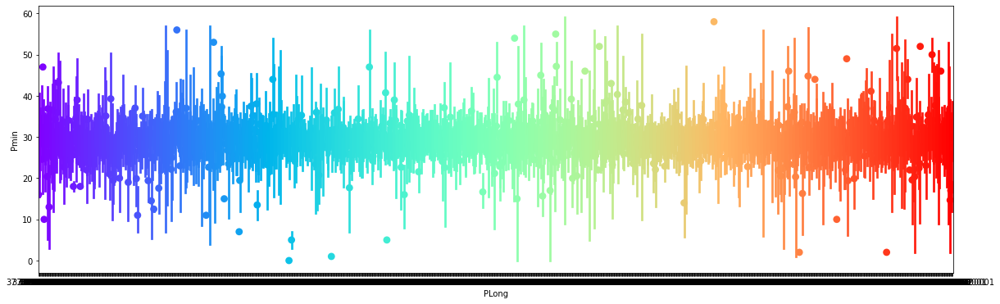

In [105]:
# Performing point plot between PLong and Pmin values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='Pmin', data=all_data, palette='rainbow')

all the values are between 25 to 35

very few are above and below of this range

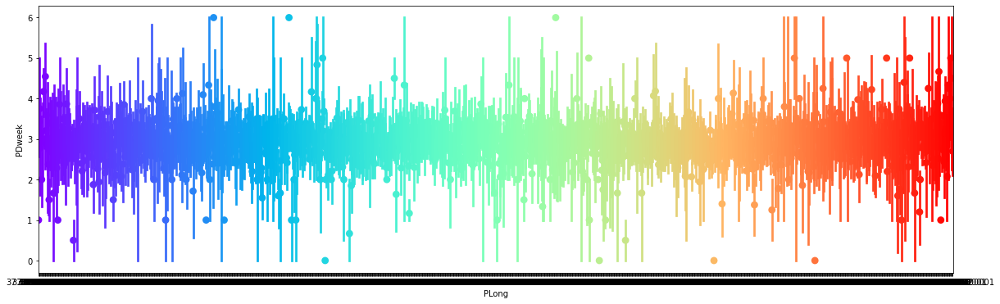

In [106]:
# Perform point plot between PLong and PDweek values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='PDweek', data=all_data, palette='rainbow')

all the values are between 2 to 4

very few are above and below of this range

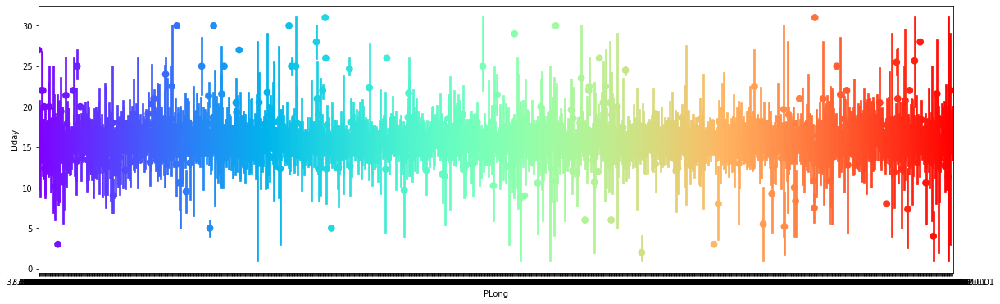

In [107]:
# Perform point plot between PLong and Dday values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='Dday', data=all_data, palette='rainbow')

all the values are between 12 to 17

very few are above and below of this range

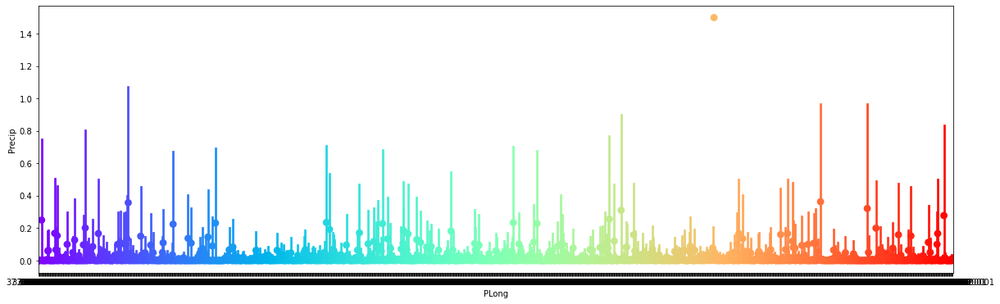

In [108]:
# Performing point plot between PLong and Precip values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='Precip', data=all_data, palette='rainbow')

all values are around 0.00 

very few are above 0.00

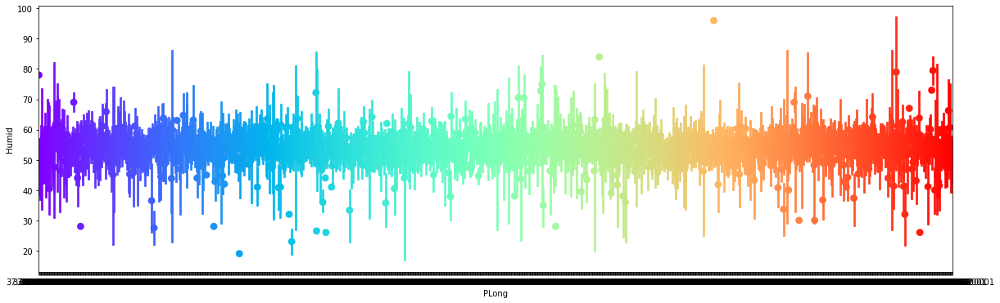

In [109]:
# Performing point plot between PLong and Humid values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLong', y ='Humid', data=all_data, palette='rainbow')

as the distribution value of PLong is increasing the value of distribution of humidity is same

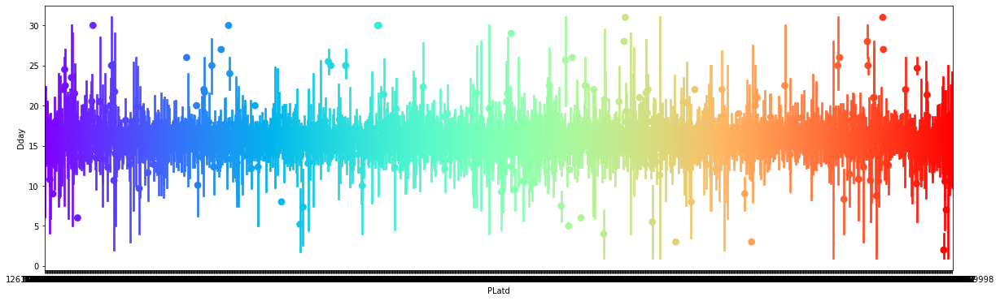

In [110]:
# Performing point plot between PLatd and Dday values 

plt.figure(figsize=(20,6))

sns.pointplot(x='PLatd', y ='Dday', data=all_data, palette='rainbow')

all valies are around 15

very few are above and below of 15

## COUNT PLOT

Text(0.5, 1.0, 'Pickup Hours Distribution')

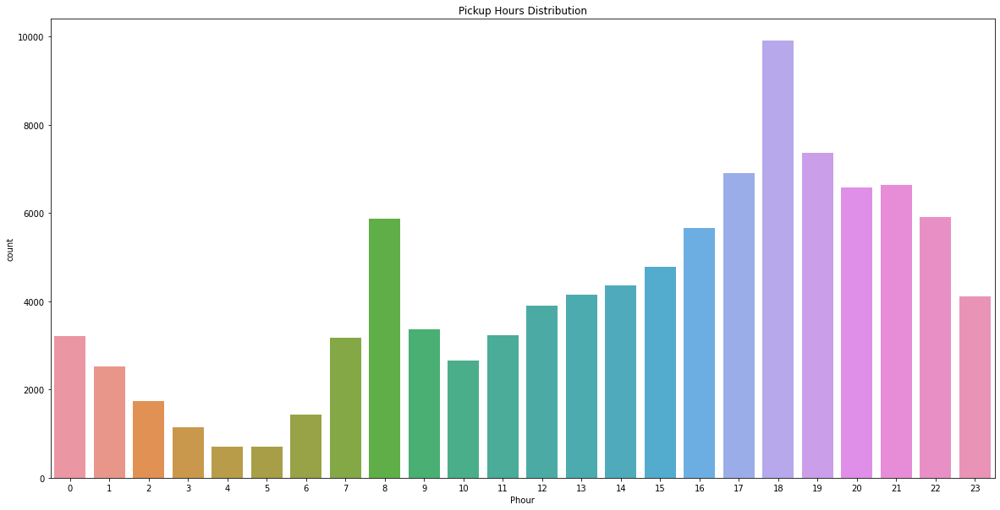

In [111]:
# Performing countplot on the pickup hour data

plt.figure(figsize=(20,10))

sns.countplot(x='Phour', data=all_data).set_title('Pickup Hours Distribution')

more pickups are on morning and evening 

Text(0.5, 1.0, 'Drop Hours Distribution')

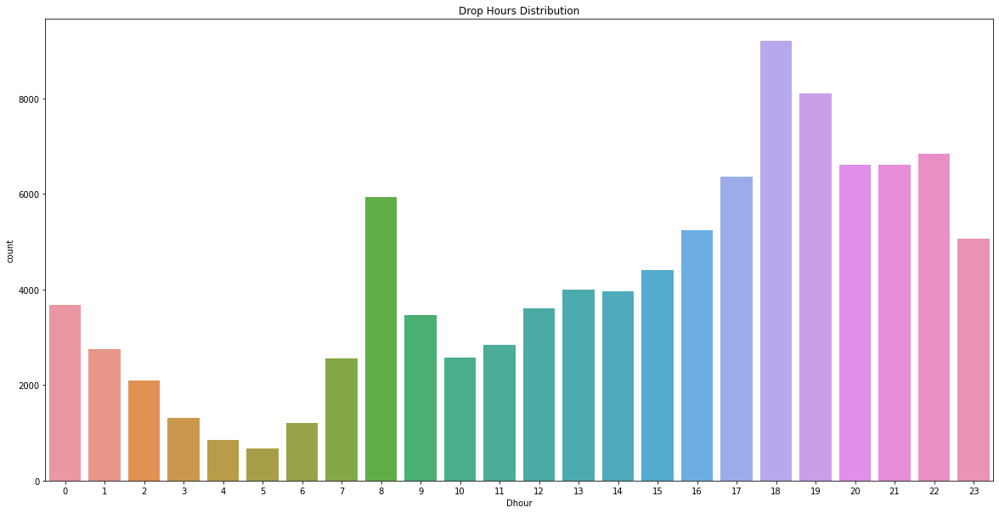

In [112]:
# Performing countplot on the drop hour data

plt.figure(figsize=(20,10))

sns.countplot(x='Dhour', data=all_data).set_title('Drop Hours Distribution')

Observation:  Dropoff hour are high at the office hours both at morning and evening



Text(0.5, 1.0, 'Duration Distribution')

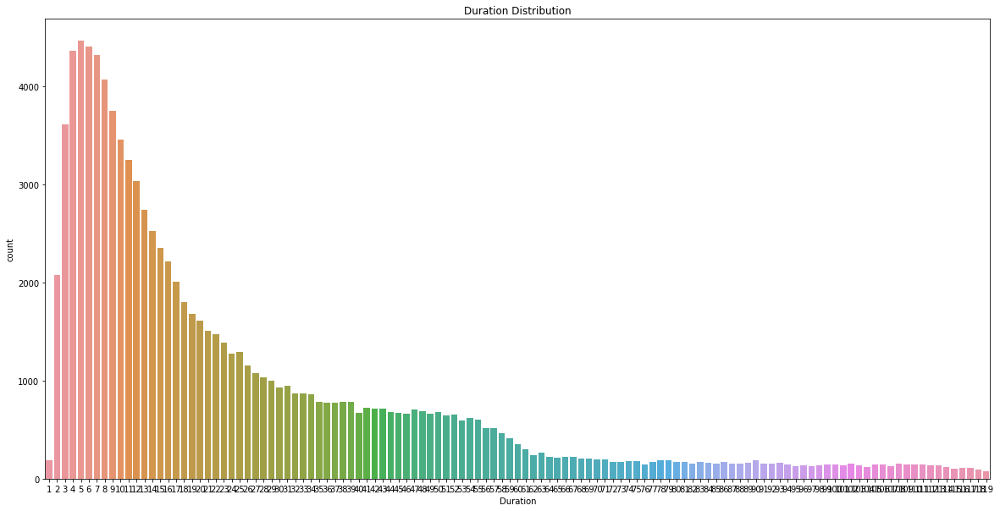

In [113]:
# Performing countplot on the duration data

plt.figure(figsize=(20,10))

sns.countplot(x='Duration', data=all_data).set_title('Duration Distribution')

distribution of duration is skewed left side



short duration trips are common

Text(0.5, 1.0, 'Distance Distribution')

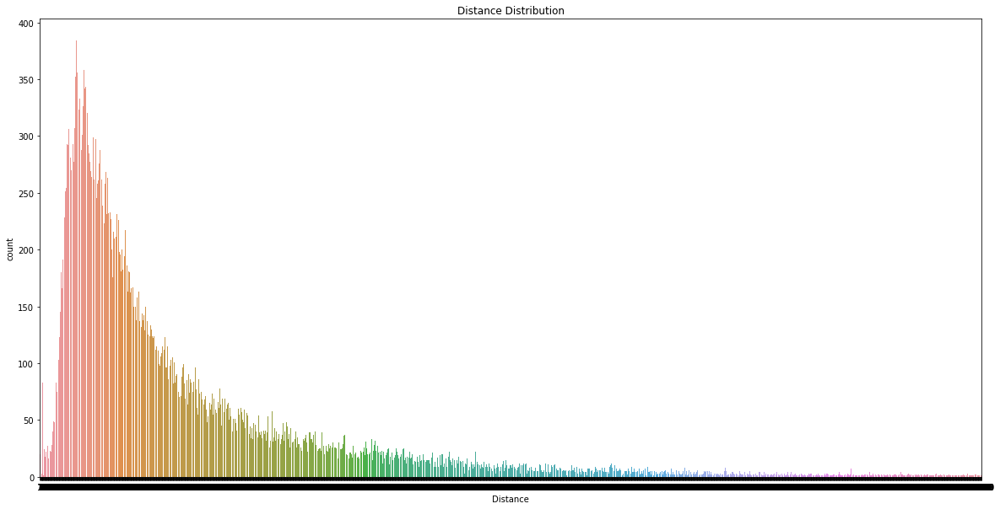

In [114]:
# Performing countplot on the distance data

plt.figure(figsize=(20,10))

sns.countplot(x='Distance', data=all_data).set_title('Distance Distribution')

distribution of data is skewed towards left 

short distance trips are common

Text(0.5, 1.0, 'PLong Distribution')

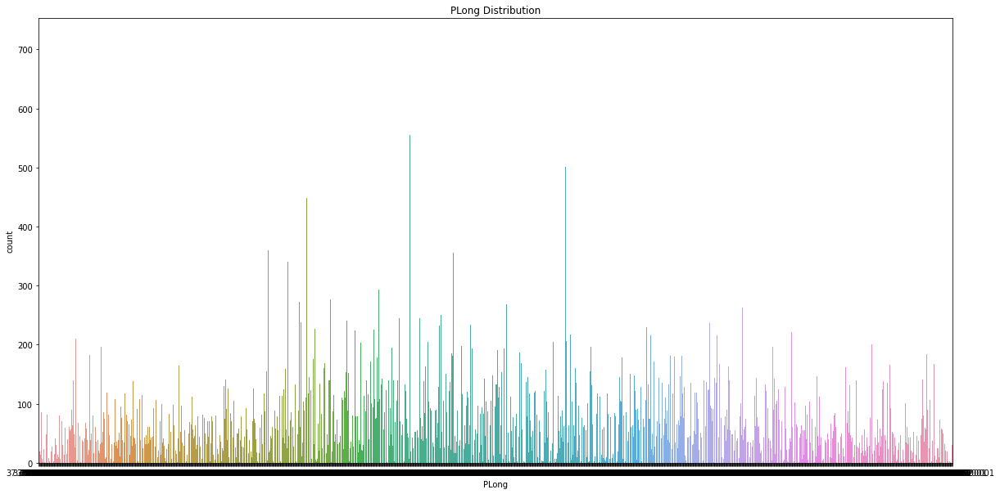

In [115]:
# Performing countplot on the PLong data

plt.figure(figsize=(20,10))

sns.countplot(x='PLong', data=all_data).set_title('PLong Distribution')


distribution of data is multimodal

Text(0.5, 1.0, 'PLatd Distribution')

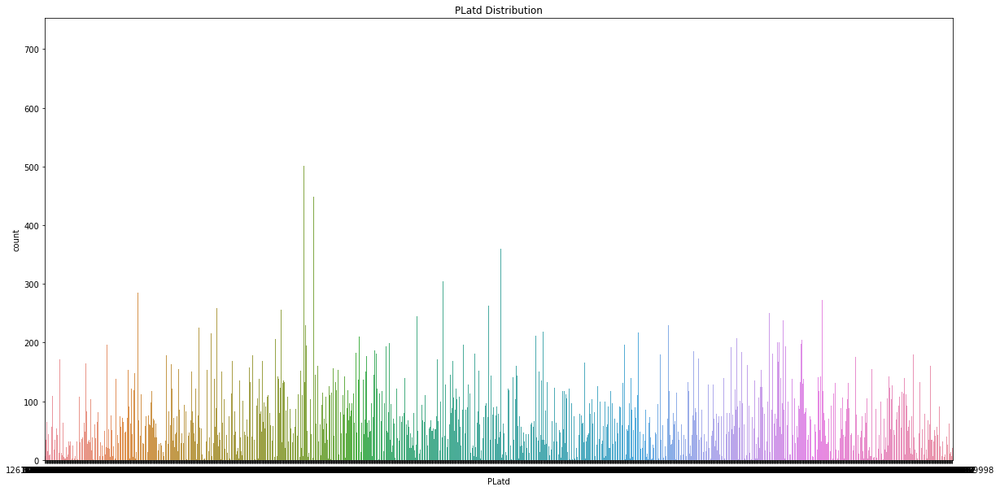

In [116]:
# Performing countplot on the PLatd data

plt.figure(figsize=(20,10))

sns.countplot(x='PLatd', data=all_data).set_title('PLatd Distribution')


distribution of data is multimodal

Text(0.5, 1.0, 'DLong Distribution')

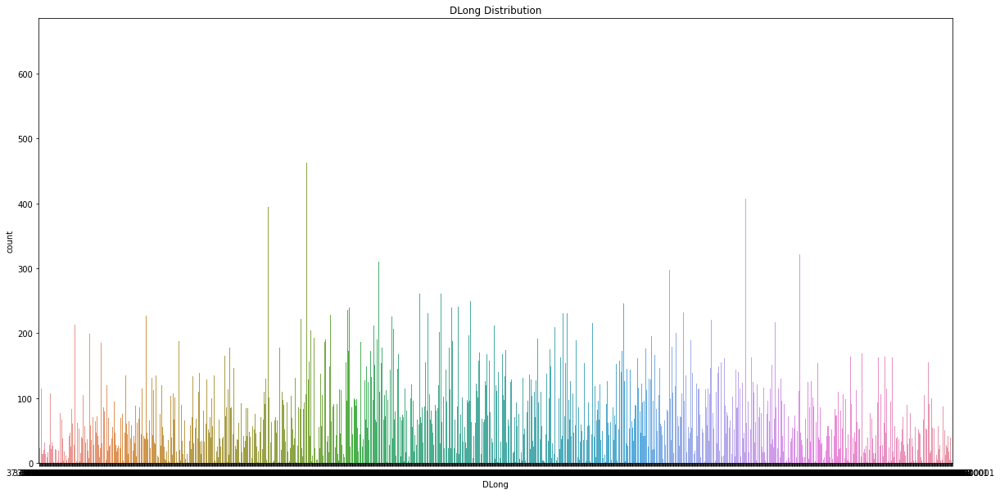

In [117]:
# Performing countplot on the Dlong data

plt.figure(figsize=(20,10))

sns.countplot(x='DLong', data=all_data).set_title('DLong Distribution')

distribution of data is multimodal

Text(0.5, 1.0, 'DLatd Distribution')

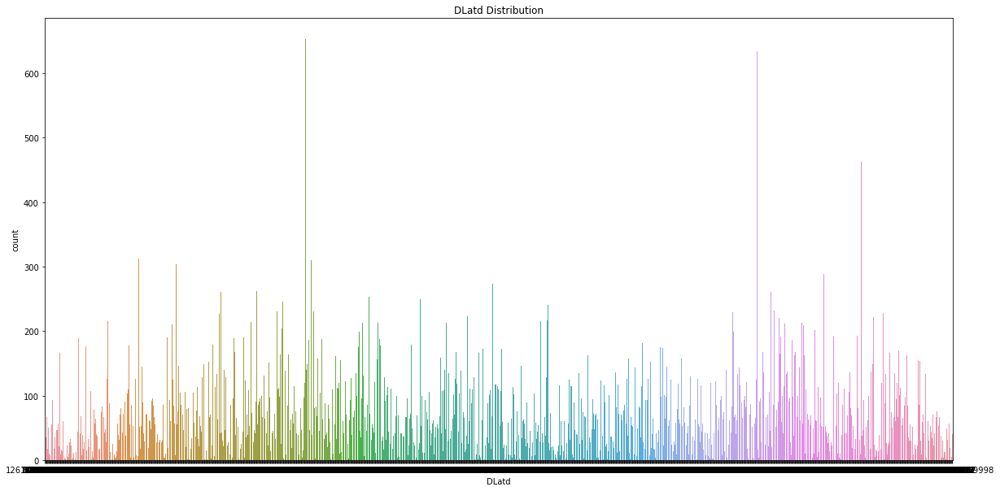

In [118]:
# Performing countplot on the Dlatd data

plt.figure(figsize=(20,10))

sns.countplot(x='DLatd', data=all_data).set_title('DLatd Distribution')

distribution of data is multimodal

Text(0.5, 1.0, 'Pmonth Distribution')

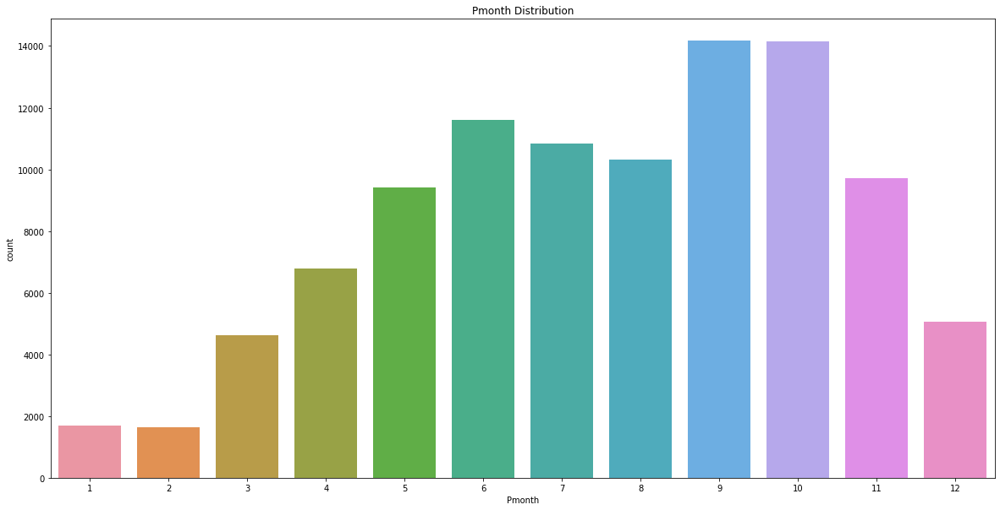

In [119]:
# Performing countplot on the Pmonth data

plt.figure(figsize=(20,10))

sns.countplot(x='Pmonth', data=all_data).set_title('Pmonth Distribution')

more picks are on end of the year

Text(0.5, 1.0, 'Pday Distribution')

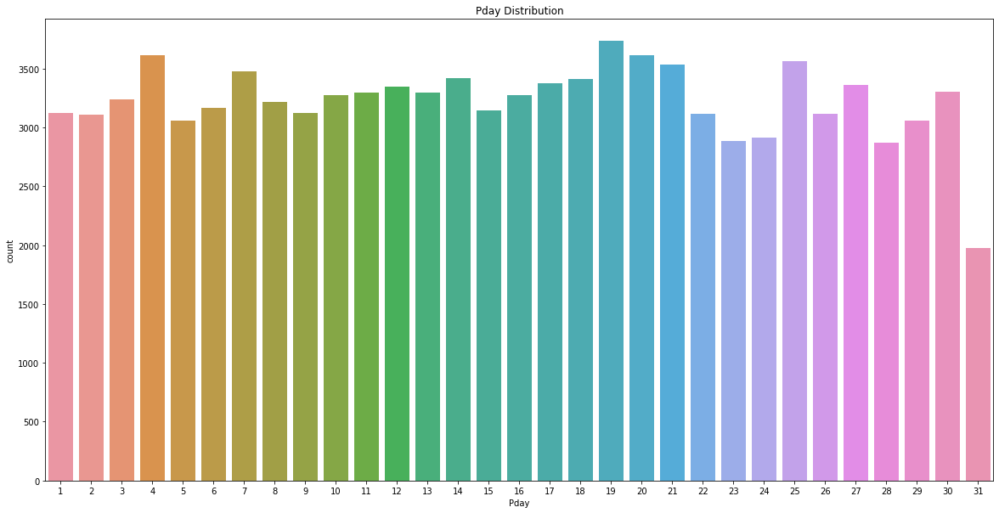

In [120]:
# Performing countplot on the Pday data

plt.figure(figsize=(20,10))

sns.countplot(x='Pday', data=all_data).set_title('Pday Distribution')

distribution of data is multimodal

pickups are  almost similar on every day of a month

Text(0.5, 1.0, 'Pmin Distribution')

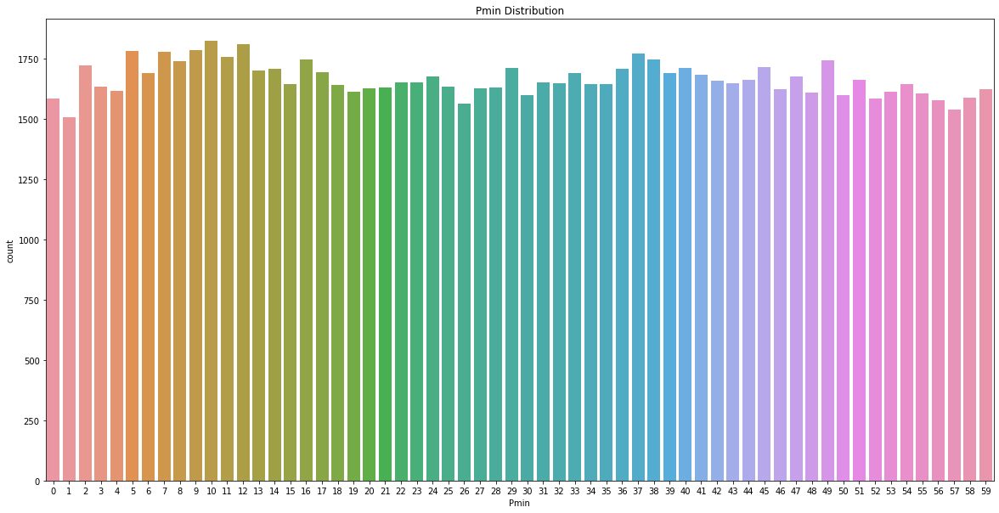

In [121]:
# Performing countplot on the pmin data

plt.figure(figsize=(20,10))

sns.countplot(x='Pmin', data=all_data).set_title('Pmin Distribution')

data is distributed equally

Text(0.5, 1.0, 'PDweek Distribution')

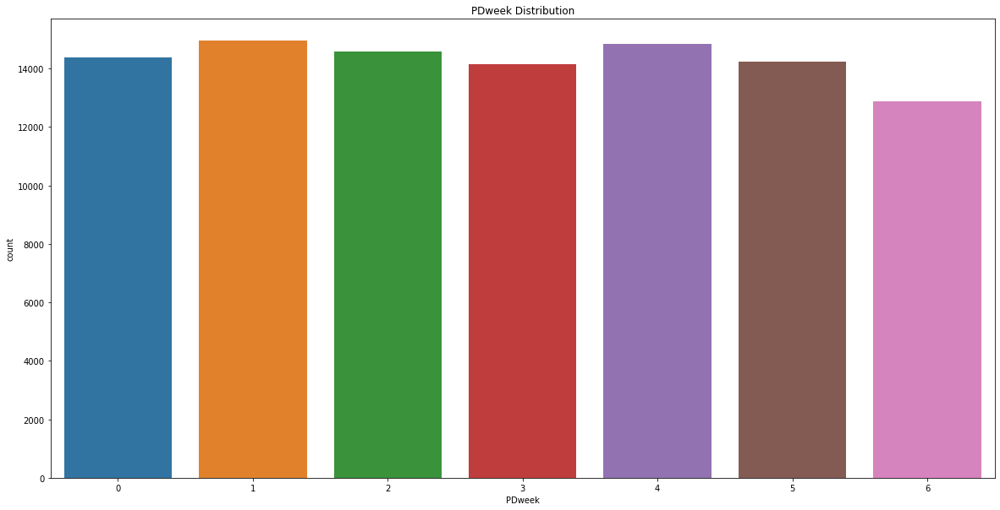

In [122]:
# Performing countplot on the PDweek data

plt.figure(figsize=(20,10))

sns.countplot(x='PDweek', data=all_data).set_title('PDweek Distribution')

data is distributed equally

Text(0.5, 1.0, 'Dday Distribution')

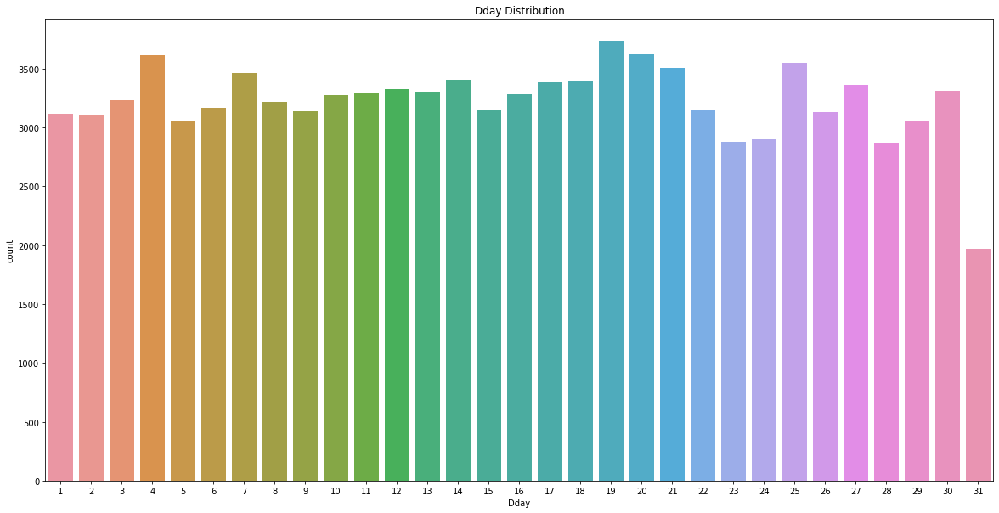

In [123]:
# Performing countplot on the Dday data

plt.figure(figsize=(20,10))

sns.countplot(x='Dday', data=all_data).set_title('Dday Distribution')

distribution of data is similar

drop-offs are almost similar on every day of a month

Text(0.5, 1.0, 'Dmin Distribution')

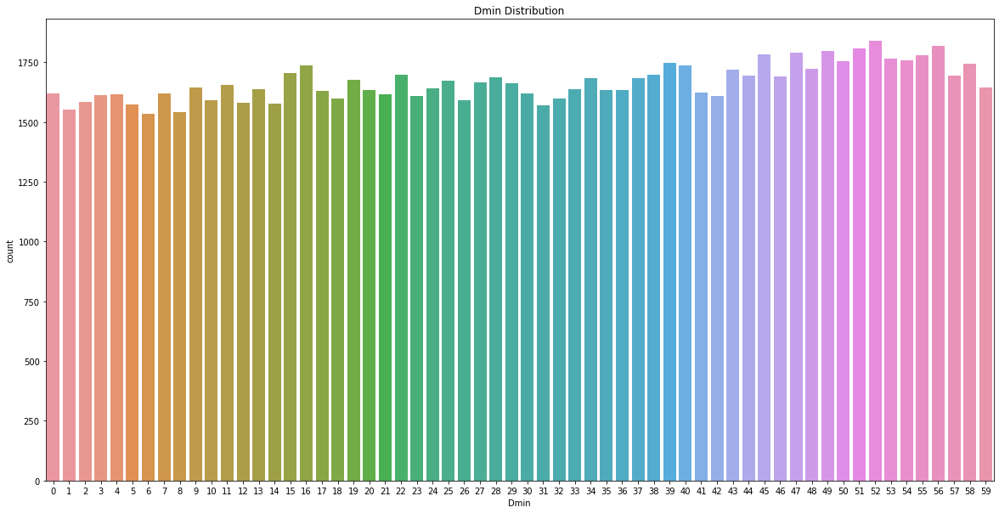

In [124]:
# Performing countplot on the Dmin data

plt.figure(figsize=(20,10))

sns.countplot(x='Dmin', data=all_data).set_title('Dmin Distribution')

data is distribited equally

drops on every minute of hour is similar

Text(0.5, 1.0, 'DDweek Distribution')

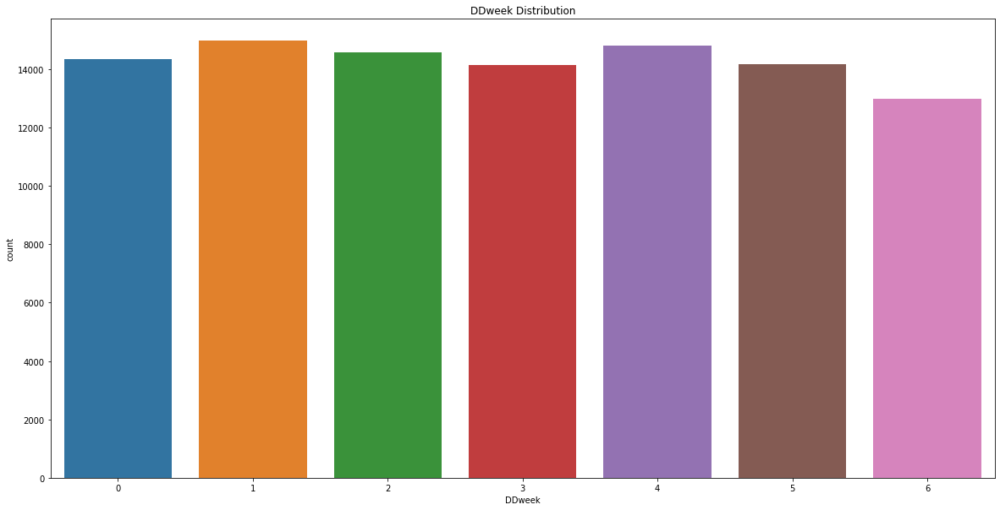

In [125]:
# Performing countplot on the DDweek data

plt.figure(figsize=(20,10))

sns.countplot(x='DDweek', data=all_data).set_title('DDweek Distribution')

drop offs on every day of a week are almost similar

Text(0.5, 1.0, 'Temp Distribution')

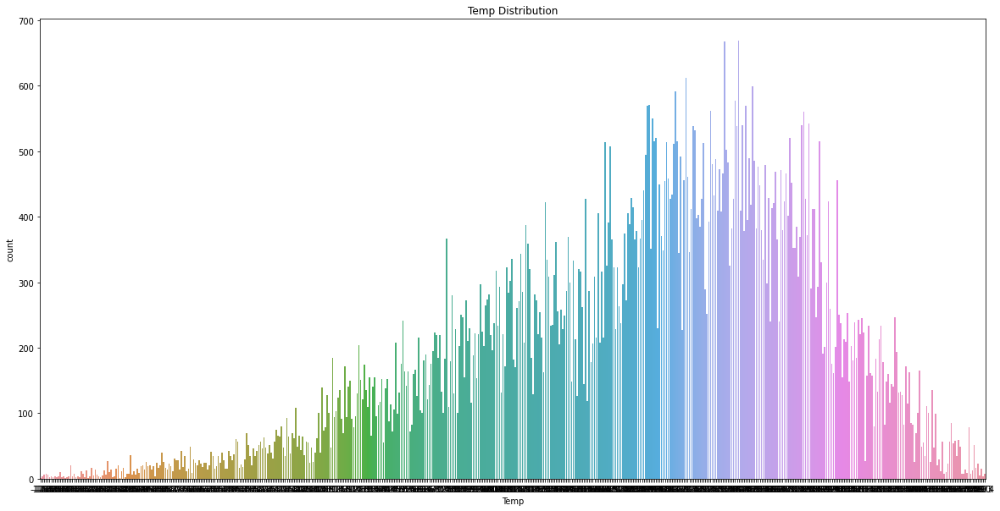

In [126]:
# Performing countplot on the Temp data

plt.figure(figsize=(20,10))

sns.countplot(x='Temp', data=all_data).set_title('Temp Distribution')

the distribution of data is skewed toward right

trips are avoided in less temperature

Text(0.5, 1.0, 'Precip Distribution')

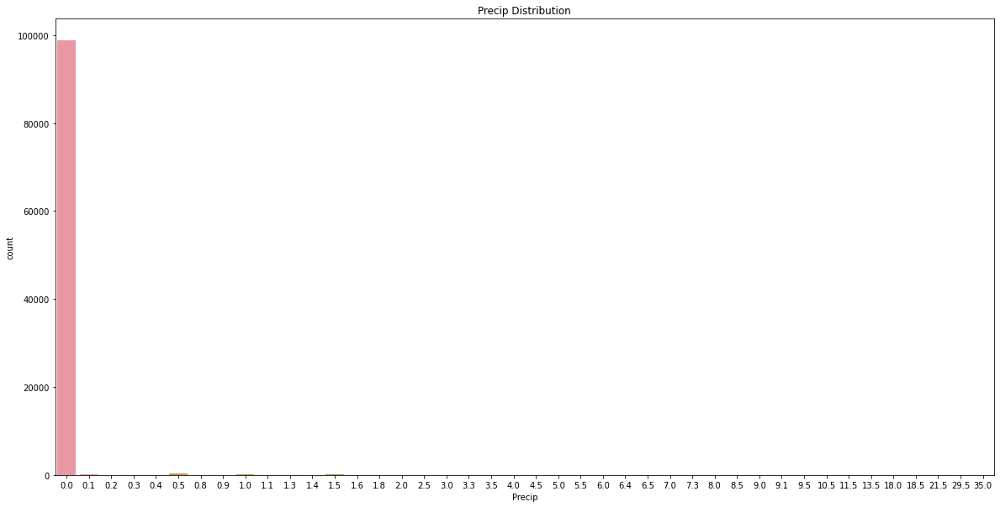

In [127]:
# Performing countplot on the Precip data

plt.figure(figsize=(20,10))

sns.countplot(x='Precip', data=all_data).set_title('Precip Distribution')

the distribution of data is skewed towards left

no trips are planned during rainy or snowy wheather

Text(0.5, 1.0, 'Wind Distribution')

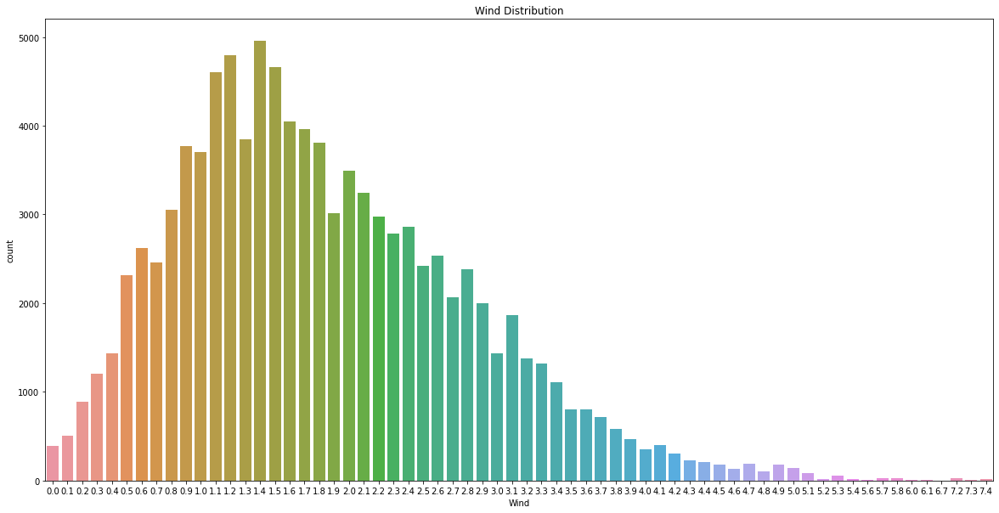

In [128]:
# Performing countplot on the Wind data

plt.figure(figsize=(20,10))

sns.countplot(x='Wind', data=all_data).set_title('Wind Distribution')

the distribution of data is skewed towards left

trips are mostly avoided in windy wheather

Text(0.5, 1.0, 'Humid Distribution')

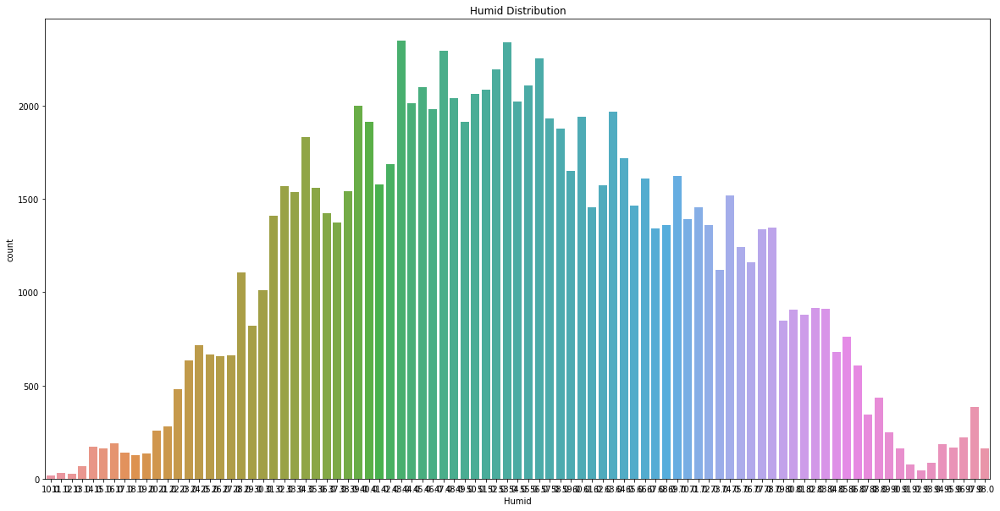

In [129]:
# Performing countplot on the humid hour data

plt.figure(figsize=(20,10))

sns.countplot(x='Humid', data=all_data).set_title('Humid Distribution')

people mostly avoid to go on trips on less humid or in extra humid wheather

Text(0.5, 1.0, 'Solar Distribution')

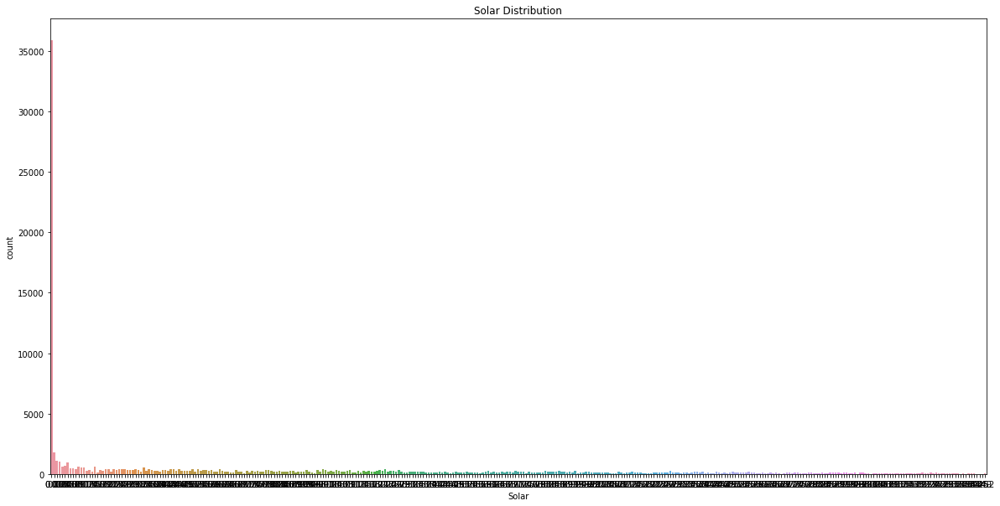

In [130]:
# Performing countplot on the solar data

plt.figure(figsize=(20,10))

sns.countplot(x='Solar', data=all_data).set_title('Solar Distribution')

the data distribution is skewed towards left side

Text(0.5, 1.0, 'Snow Distribution')

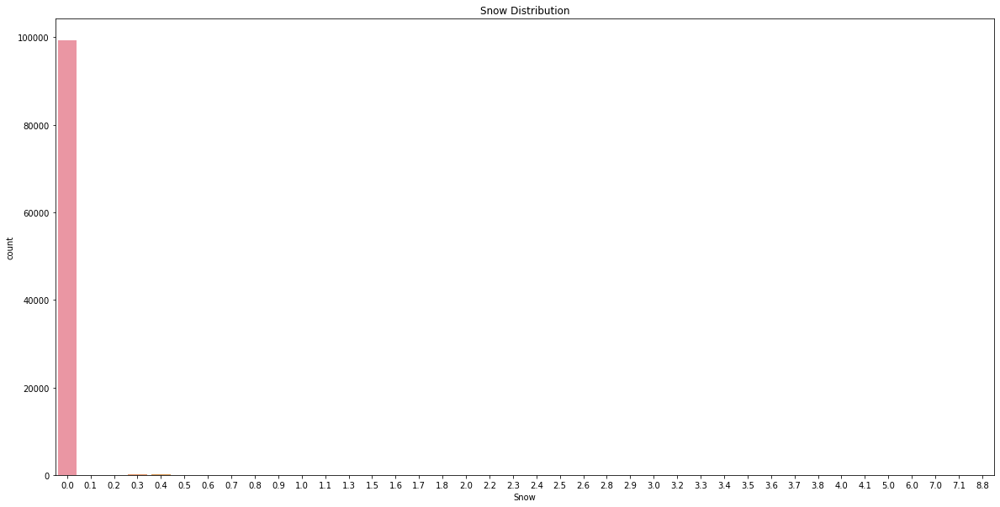

In [131]:
# Performing countplot on the Snow data

plt.figure(figsize=(20,10))

sns.countplot(x='Snow', data=all_data).set_title('Snow Distribution')

the data distribution is skewed towards left side

more trips are during  when there is no snowfall.

Text(0.5, 1.0, 'GroundTemp Distribution')

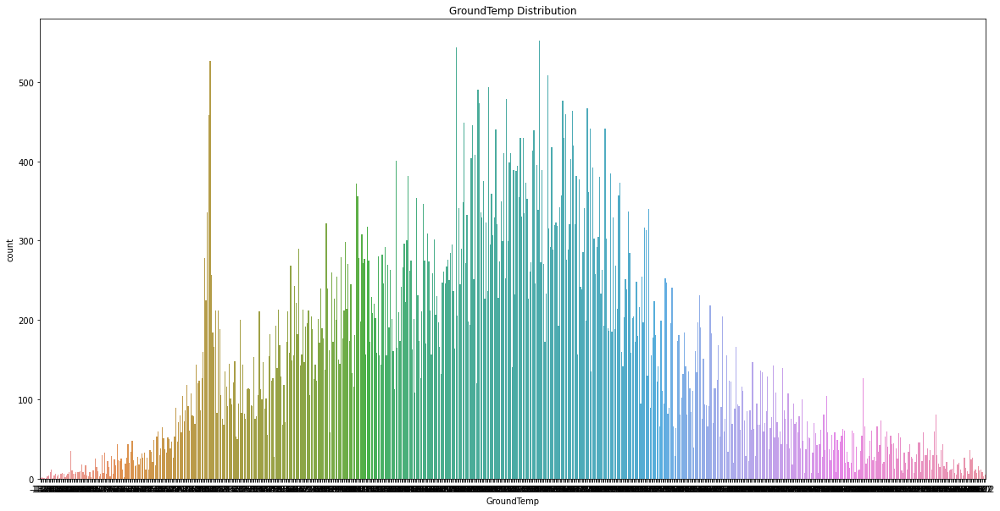

In [132]:
# Performing countplot on the GroundTemp data

plt.figure(figsize=(20,10))

sns.countplot(x='GroundTemp', data=all_data).set_title('GroundTemp Distribution')

the distribution of data is multimodel

Text(0.5, 1.0, 'Dust Distribution')

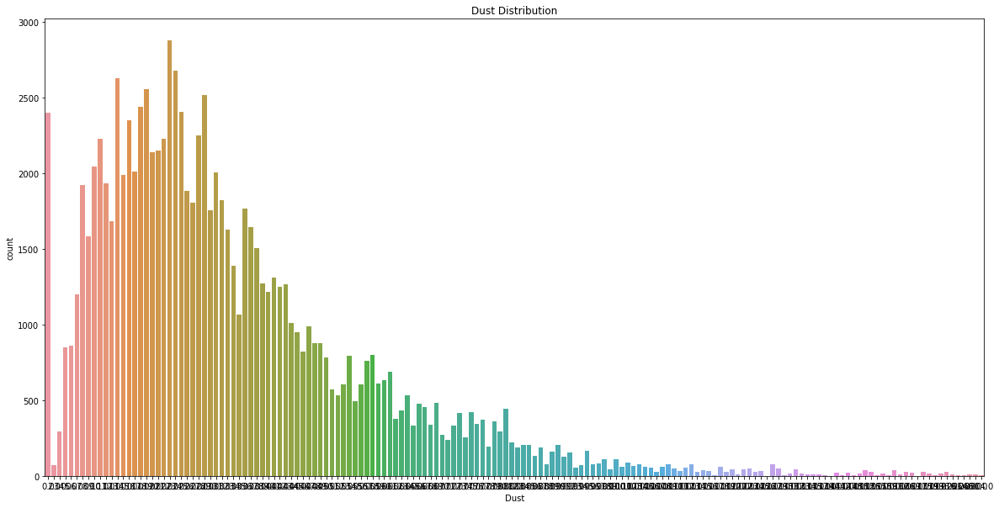

In [133]:
# Performing countplot on the Dust data

plt.figure(figsize=(20,10))

sns.countplot(x='Dust', data=all_data).set_title('Dust Distribution')

distribution of data is skewed towards left

more trips are done when there is less dust

## Boxen Plot

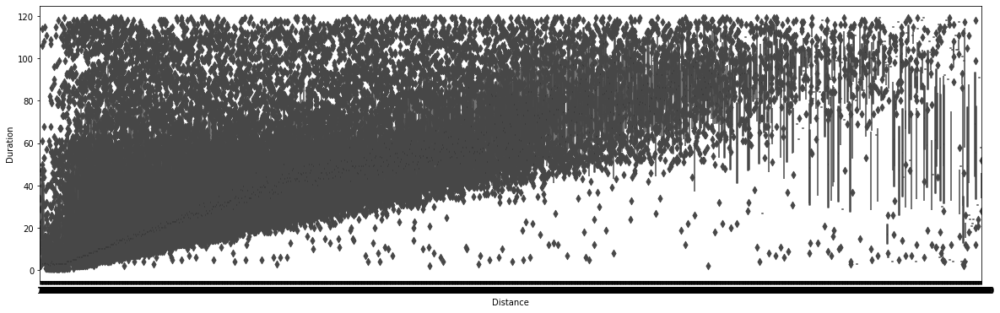

In [134]:
# Performing boxen plot between Distance and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Distance', y ='Duration', data=all_data, palette='rainbow')


distribution of distance is increasing as the duration  is increasing

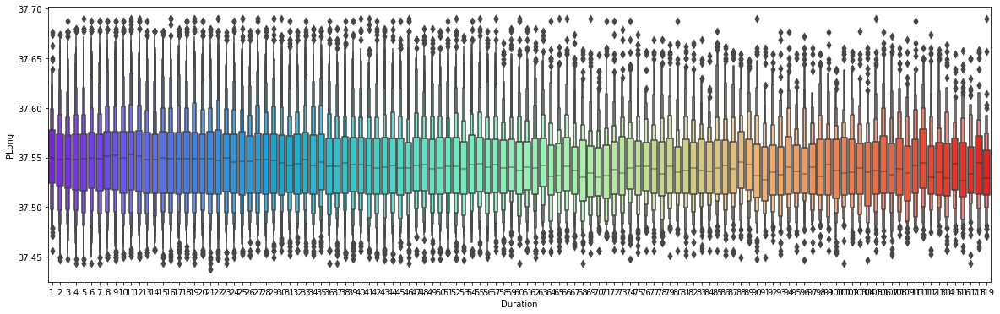

In [135]:
# Performing boxen plot between Duration and Plong 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Duration', y ='PLong', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical.
There is no relation between Plong and  Duration

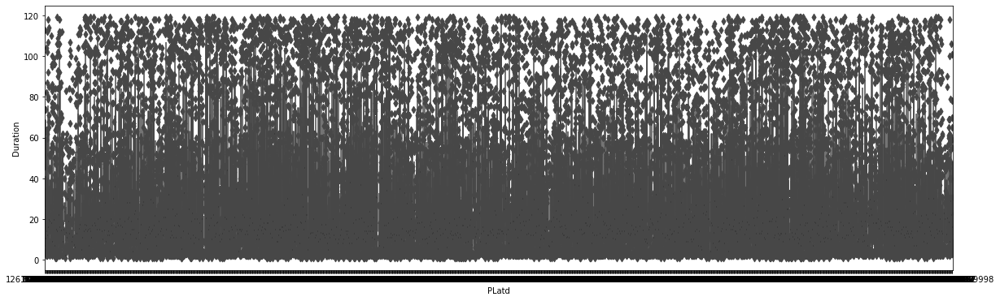

In [136]:
# Performing boxen plot between PLatd and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='PLatd', y ='Duration', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical.
There is no relation between duration and Platd



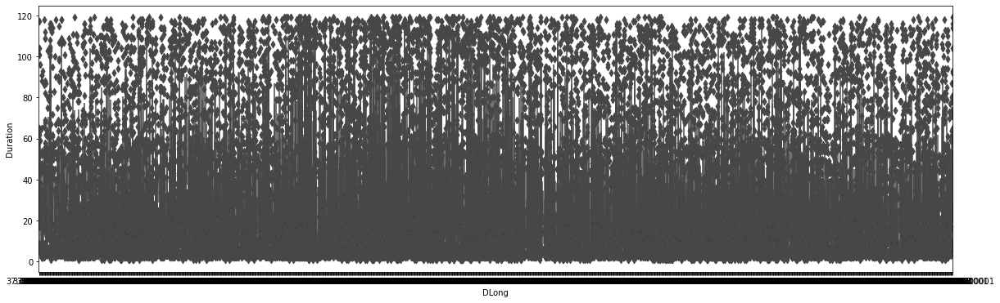

In [137]:
# Perform boxen plot between DLong and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='DLong', y ='Duration', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical.
There is no relation between duration and Dlong

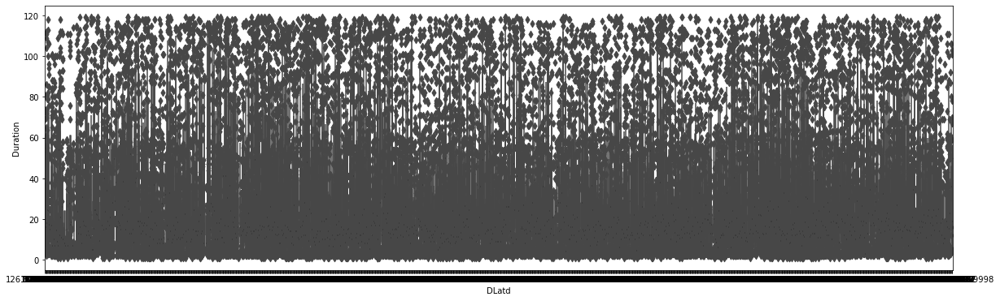

In [138]:
# Performing boxen plot between Dlatd and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='DLatd', y ='Duration', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical. There is no relation between duration and Dlatd

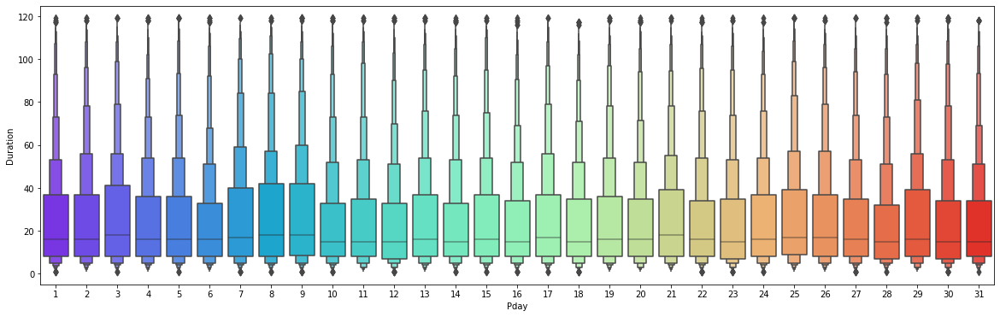

In [139]:
# Performing boxen plot between Pday and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Pday', y ='Duration', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical. There is no relation between duration and pday

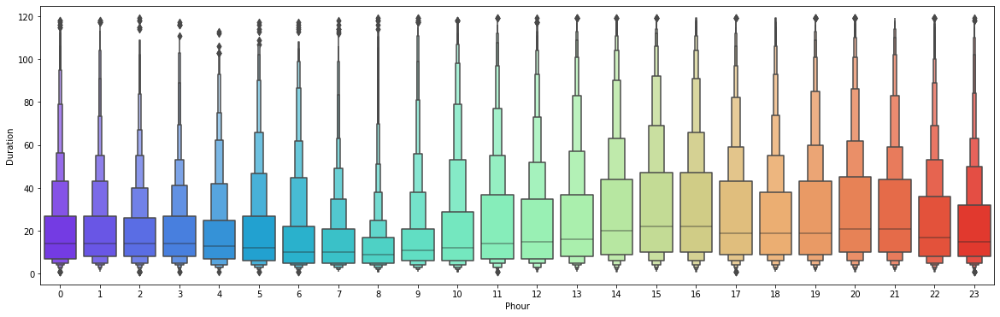

In [140]:
# Performing boxen plot between Phour and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Phour', y ='Duration', data=all_data, palette='rainbow')

there is weak relation between duration and Phours

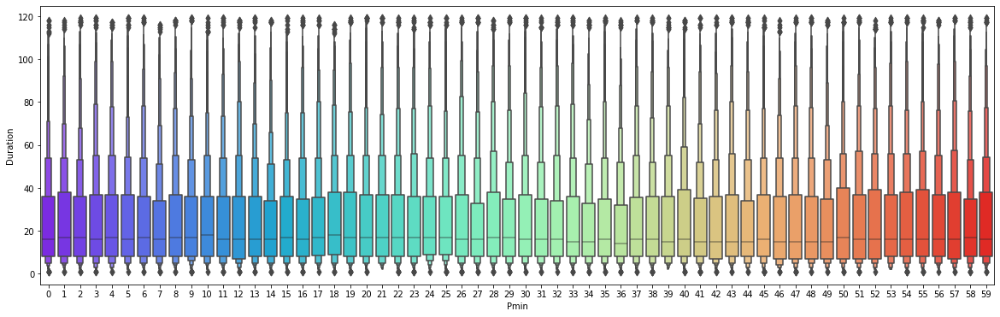

In [141]:
# Performing boxen plot between Pmin and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Pmin', y ='Duration', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical. There is no relation between duration and Pmin

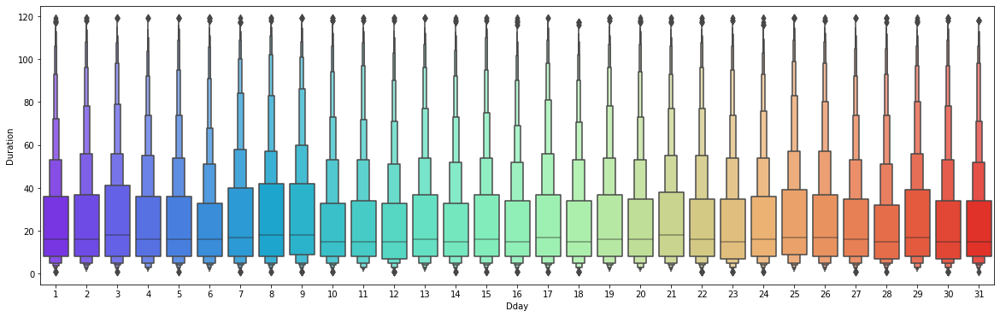

In [142]:
# Performing boxen plot between Dday and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Dday', y ='Duration', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical. There is no relation between duration and Dday

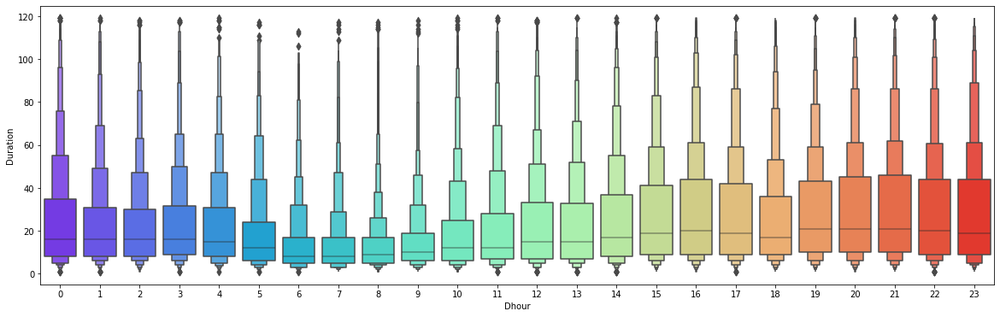

In [143]:
# Performing boxen plot between Dhour and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Dhour', y ='Duration', data=all_data, palette='rainbow')

there is weak relation between duration and Dhour

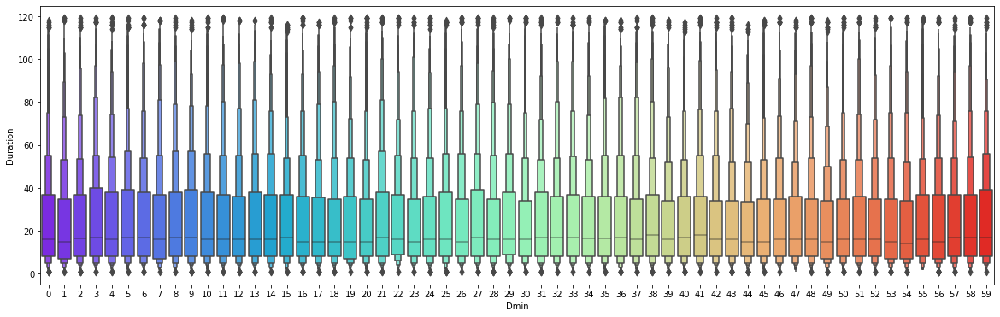

In [144]:
# Performing boxen plot between Dmin and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Dmin', y ='Duration', data=all_data, palette='rainbow')

there is no relation between duration and Dmin

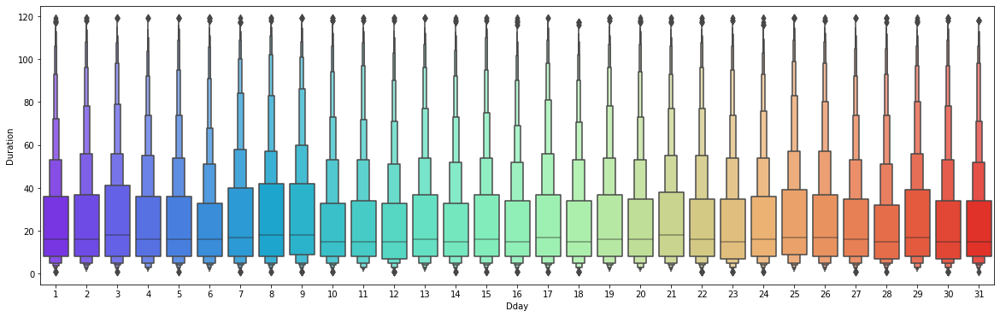

In [145]:
# Performing boxen plot between Dday and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Dday', y ='Duration', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical. There is no relation between duration and Dday

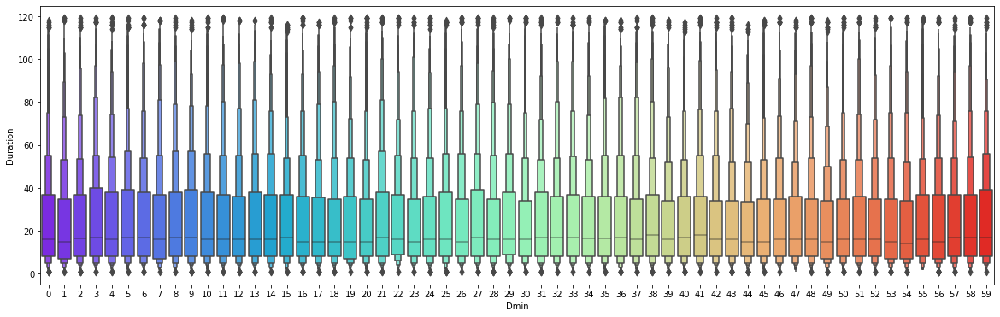

In [146]:
# Performing boxen plot between Dmin and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Dmin', y ='Duration', data=all_data, palette='rainbow')

there is no relation between duration and Dmin

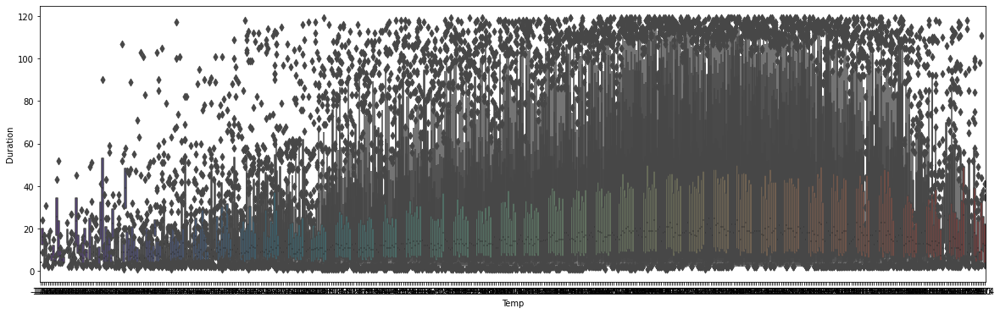

In [147]:
# Performing boxen plot between temp and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Temp', y ='Duration', data=all_data, palette='rainbow')

there is positive relation between duration and temperature

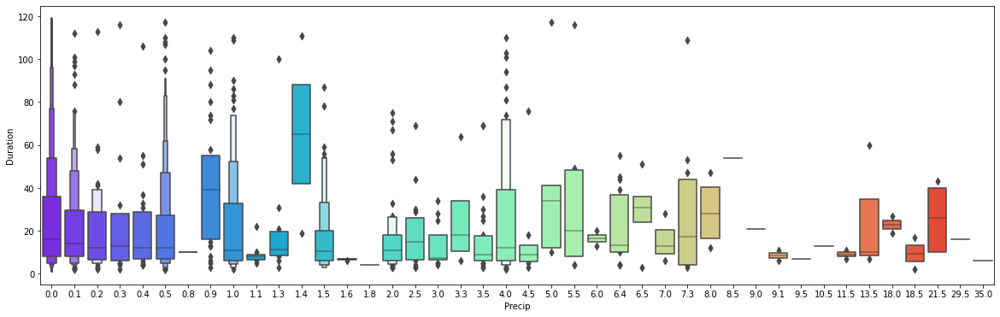

In [148]:
# Performing boxen plot between Precip and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Precip', y ='Duration', data=all_data, palette='rainbow')

no relation between duration and precipitation

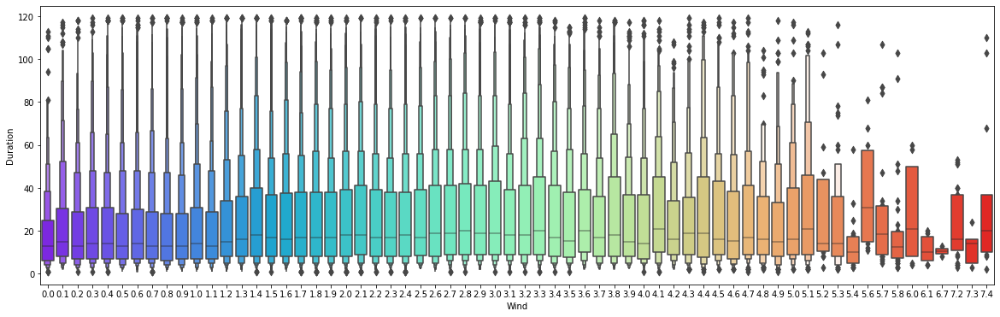

In [149]:
# Performing boxen plot between wind and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Wind', y ='Duration', data=all_data, palette='rainbow')

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical. There is no relation between duration and wind

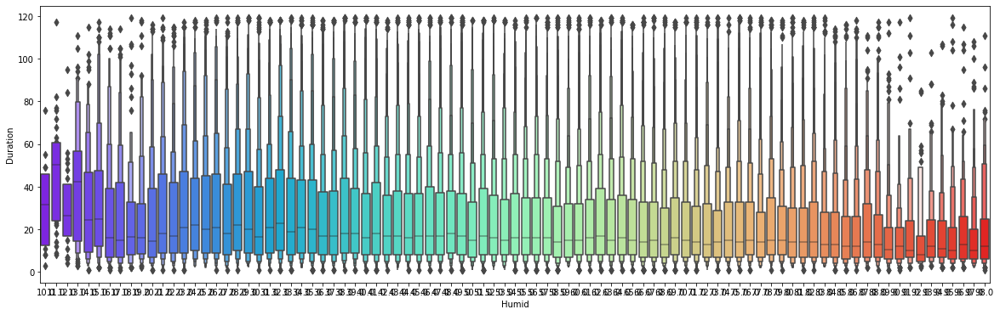

In [150]:
# Performing boxen plot between Humid and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Humid', y ='Duration', data=all_data, palette='rainbow')

duration and humidity have weak correlation between them

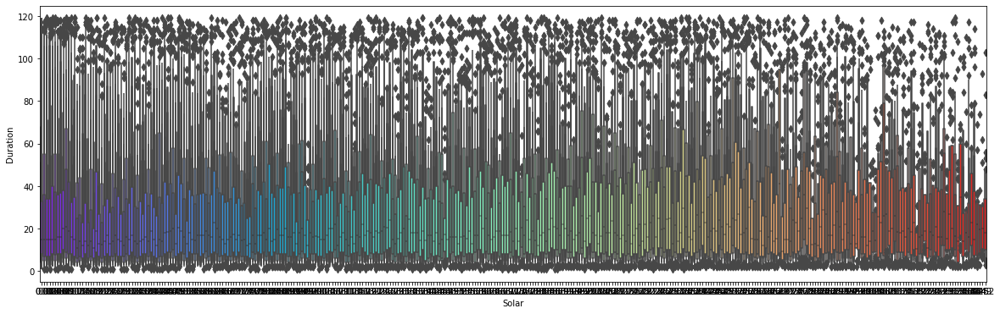

In [151]:
# Performing boxen plot between Solar and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Solar', y ='Duration', data=all_data, palette='rainbow')

solar raditation and duration are correlated to eachother.

as the solar radiation increases duration also increases

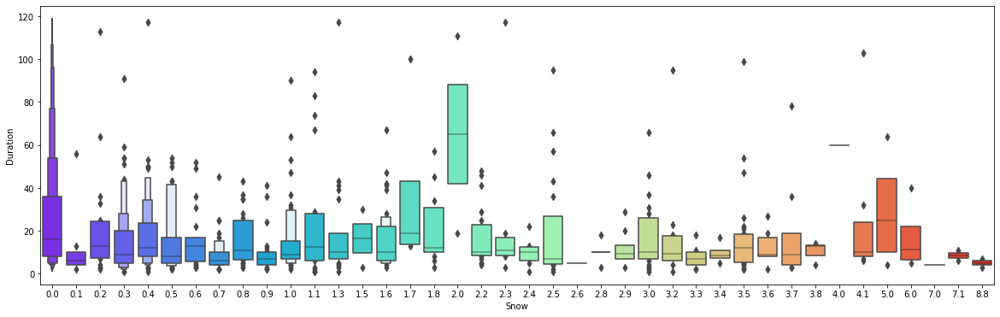

In [152]:
# Performing boxen plot between Snow and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Snow', y ='Duration', data=all_data, palette='rainbow')

no relation between snow and duration

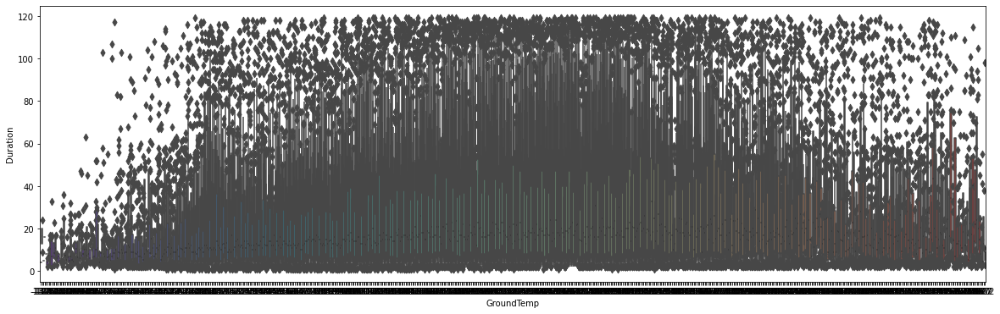

In [153]:
# Performing boxen plot between GroundTemp and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='GroundTemp', y ='Duration', data=all_data, palette='rainbow')

duration and ground temperature are correlated

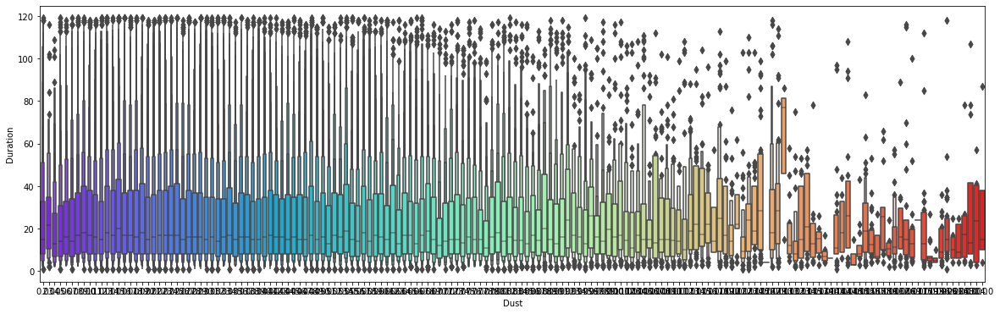

In [154]:
# Performing boxen plot between Dust and Duration 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Dust', y ='Duration', data=all_data, palette='rainbow')

there is not much difference in the value of dust as duration increases.

there is weak relation between duration and dust.

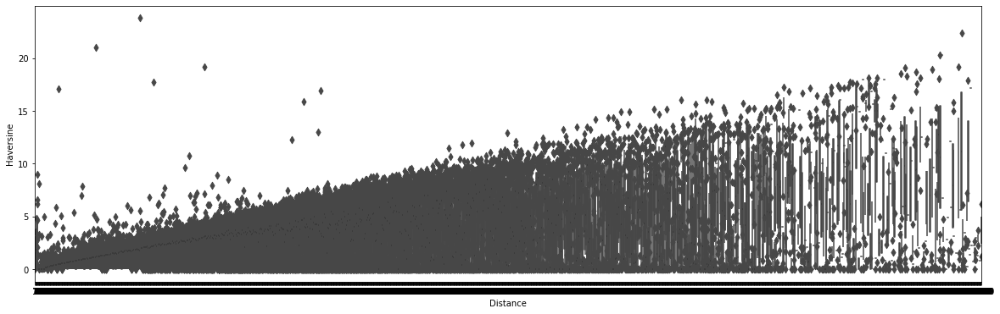

In [155]:
# Performing boxen plot between Distance and Haversine 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Distance', y ='Haversine', data=all_data, palette='rainbow')

there is weak relation between distance and haversine

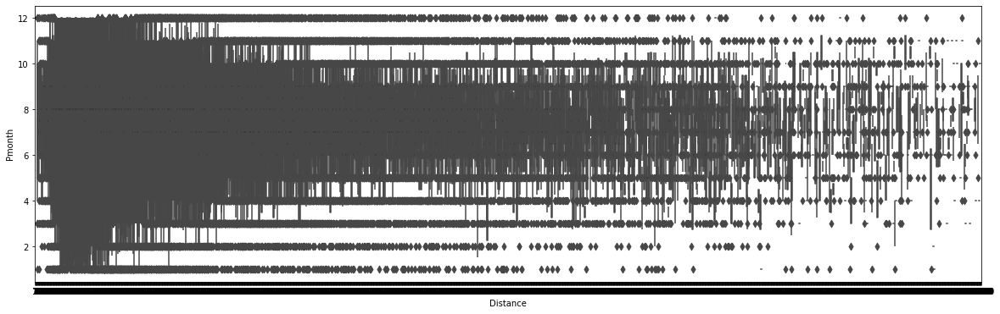

In [156]:
# Performing boxen plot between Distance and Pmonth 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Distance', y ='Pmonth', data=all_data, palette='rainbow')

there is no relation between distance and Pmonth

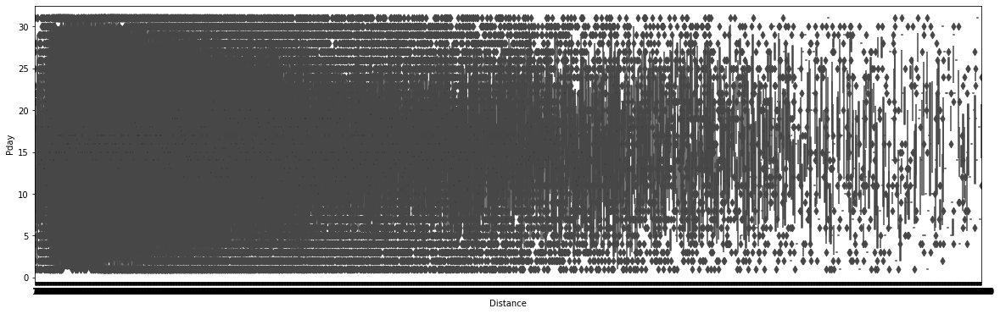

In [157]:
# Performing boxen plot between distance and Pday 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Distance', y ='Pday', data=all_data, palette='rainbow')

no relation between distance Pday

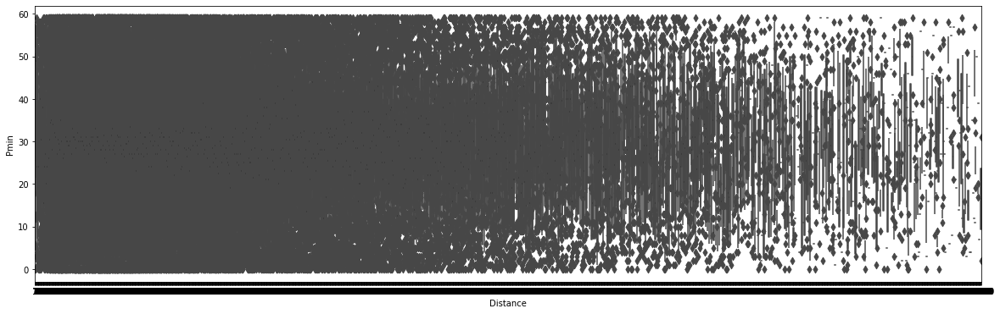

In [158]:
# Performing boxen plot between distance and Pmin 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Distance', y ='Pmin', data=all_data, palette='rainbow')

there is no relation between distance and Pmin

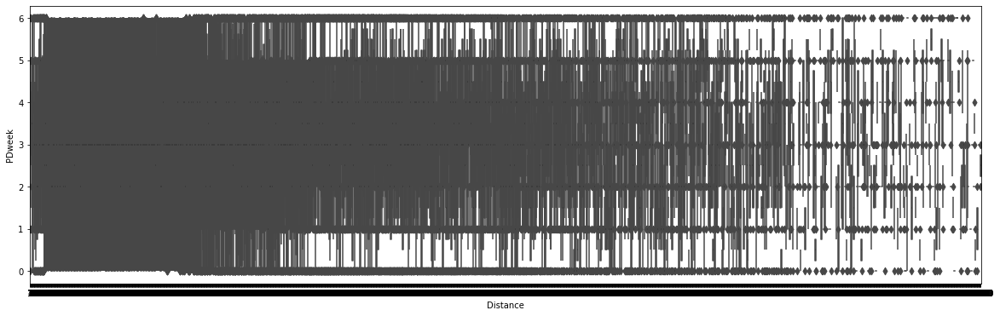

In [159]:
# Performing boxen plot between Distance and PDweek 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Distance', y ='PDweek', data=all_data, palette='rainbow')

there is no relation between distance and PDweek

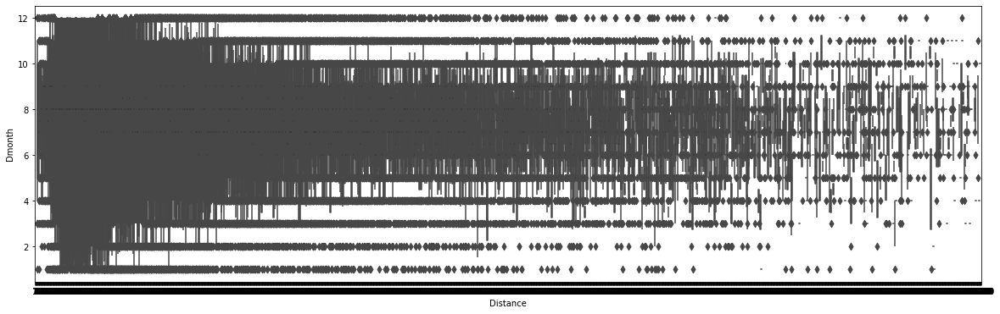

In [160]:
# Performing boxen plot between Distance and Dmonth 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Distance', y ='Dmonth', data=all_data, palette='rainbow')

there is no relation bertween distance and Dmonth

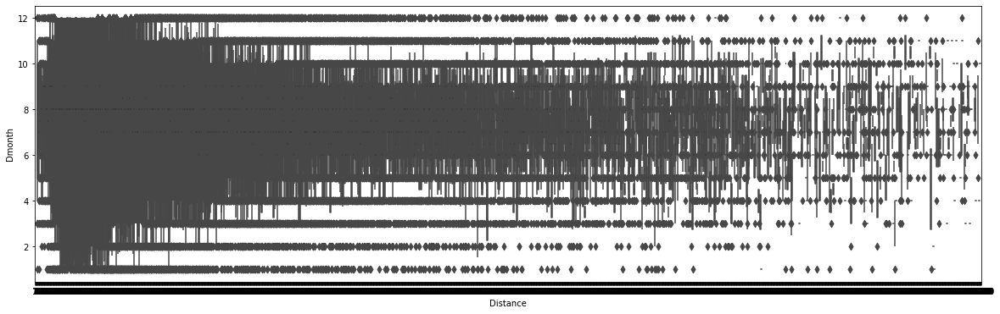

In [161]:
# Performing boxen plot between Distance and Dday 

plt.figure(figsize=(20,6))

sns.boxenplot(x='Distance', y ='Dmonth', data=all_data, palette='rainbow')

there is no relation between distance and Dday

## DENDOGRAM

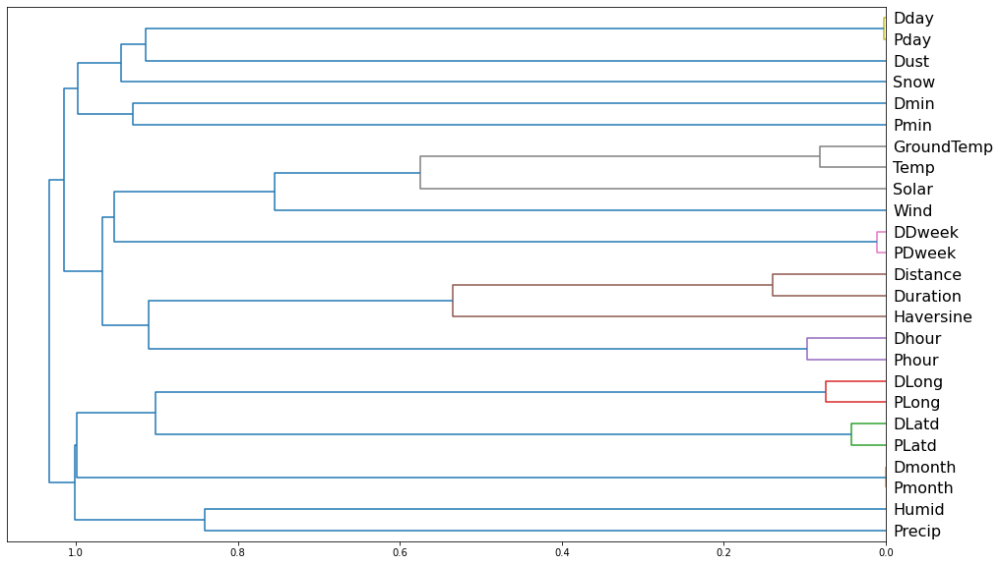

In [162]:
# Plotting a Dendrogram on the columns of the dataset

X = all_data

import scipy
from scipy.cluster import hierarchy as hc

corr = np.round(scipy.stats.spearmanr(X).correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,10))
dendrogram = hc.dendrogram(z,labels=X.columns, orientation='left', leaf_font_size=16)
plt.show()


Observation: All connected are compoundly related to each other like latitudes to longitudes, distance to duration and many more.

## Modelling

NOTE:
The dataset has 9.6 million samples.

We have used only 100000 samples for training.

If you want you can use complete dataset.

Using complete dataset will take longer time to train the model.

In [10]:
# Splitting the data into Labels and target
def proc_df(df, y_fld=None):
    df = df.copy()
    if y_fld is None: y = None
    else:
        y = df[y_fld].values
    res = [df, y]
    return res   

In [11]:
# Processing the whole dataframe
df, y = proc_df(all_data, 'Duration')

In [12]:
# Splitting the dataset into train and test set

from sklearn.model_selection import train_test_split

X = df.drop(['Duration'], axis=1)
Y = y
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.25, random_state=123)

In [166]:
# Checking the shape of all the splitted dataset

X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((75000, 24), (25000, 24), (75000,), (25000,))

In [13]:
# importing necessary libraries for geting metrics of models
import math
import sklearn.metrics as metrics
from sklearn.metrics import median_absolute_error

# Function for calculating RMSE 
def rmse(x,y): 
  return math.sqrt(((x-y)**2).mean())
    
# Function for calculating all the relevant metrics 
def print_score(m):
    res = [rmse(m.predict(X_train), Y_train), rmse(m.predict(X_test), Y_test),
           m.score(X_train, Y_train), m.score(X_test, Y_test),
           median_absolute_error(m.predict(X_train), Y_train), median_absolute_error(m.predict(X_test), Y_test),
           metrics.mean_absolute_error(m.predict(X_train), Y_train), metrics.mean_absolute_error(m.predict(X_test), Y_test)]
    

    print("RMSE-Train: " + str(res[0]) + "\nRMSE-Test: " + str(res[1]) + "\nScore-Train: " + str(res[2]) + "\nScore-Test: " + str(res[3]) +
         "\nMedAE-Train: " + str(res[4]) + "\nMedAE-Test: " + str(res[5]) + "\nMeanAE-Train: " + str(res[6]) + "\nMeanAE-Test: " + str(res[7]),'\n')

In [14]:
# Visualize importance of all the features in the dataset for the prediction

def visualize_importance(feature_importances, feat_train_df):
    feature_importance_df = pd.DataFrame()
     # creating dataframe for feature name and feature importance
    _df = pd.DataFrame()
    _df['feature_importance'] = feature_importances
    _df['column'] = feat_train_df.columns
    feature_importance_df = pd.concat([feature_importance_df, _df], 
                                      axis=0, ignore_index=True)
    # grouping all data and sorting in descending order
    order = feature_importance_df.groupby('column')\
        .sum()[['feature_importance']]\
        .sort_values('feature_importance', ascending=False).index[:50]
    # ploting feature importance data using boxenplot
    fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
    sns.boxenplot(data=feature_importance_df, 
                  x='feature_importance', 
                  y='column', 
                  order=order, 
                  ax=ax, 
                  palette='viridis', 
                  orient='h')
    ax.tick_params(axis='x', rotation=0)
    ax.set_title('Importance')
    ax.grid()
    fig.tight_layout()
    # return fig, ax
    return fig, ax


# Linear Regression

RMSE-Train: 16.473716385094296
RMSE-Test: 16.20435190803901
Score-Train: 0.567833871186963
Score-Test: 0.5784189628613827
MedAE-Train: 6.856575587865393
MedAE-Test: 6.8240500385959635
MeanAE-Train: 10.073015807662866
MeanAE-Test: 10.010842481342978 

CPU times: user 326 ms, sys: 180 ms, total: 506 ms
Wall time: 449 ms


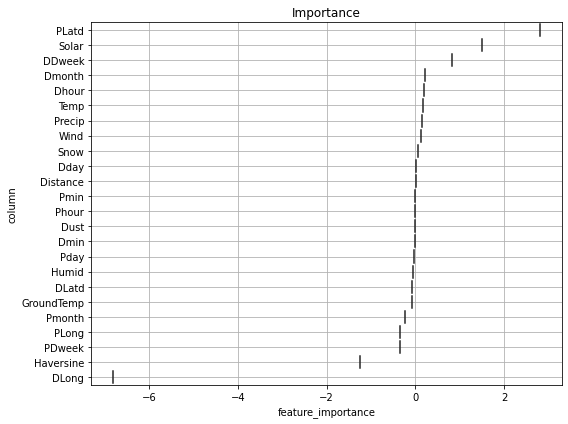

In [15]:
%%time

from sklearn.linear_model import LinearRegression

lModel =LinearRegression()

lModel.fit(X_train, Y_train)

print_score(lModel)

fig, ax = visualize_importance(lModel.coef_, X_train)

## Random Forest Regressor

RMSE-Train: 4.918717616479591
RMSE-Test: 12.988664588478677
Score-Train: 0.9614724549322149
Score-Test: 0.7291388365308833
MedAE-Train: 1.3299999999999983
MedAE-Test: 3.66
MeanAE-Train: 2.7960297333333335
MeanAE-Test: 7.499914400000001 

CPU times: user 2min 50s, sys: 235 ms, total: 2min 50s
Wall time: 3min 2s


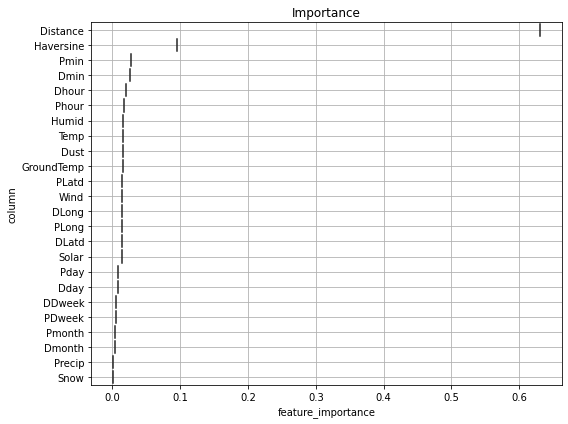

In [16]:
%%time
from sklearn.ensemble import RandomForestRegressor

rf= RandomForestRegressor()

rf.fit(X_train, Y_train)

print_score(rf)

fig, ax = visualize_importance(rf.feature_importances_, X_train)

## KNeighbors Regressor

In [17]:
%%time
from sklearn.neighbors import KNeighborsRegressor

knnr = KNeighborsRegressor()

knnr.fit(X_train, Y_train)

print_score(knnr)

RMSE-Train: 12.812384113297052
RMSE-Test: 15.838890617716885
Score-Train: 0.7385868340663932
Score-Test: 0.597220596058391
MedAE-Train: 3.0
MedAE-Test: 3.8000000000000007
MeanAE-Train: 7.110546666666667
MeanAE-Test: 8.83076 

CPU times: user 10min 35s, sys: 30.9 s, total: 11min 6s
Wall time: 9min 31s


## Gradient Boosting Regressor

RMSE-Train: 12.56569561259724
RMSE-Test: 12.708780891377248
Score-Train: 0.7485563763377527
Score-Test: 0.7406862652754143
MedAE-Train: 3.7933676282440985
MedAE-Test: 3.859636318642294
MeanAE-Train: 7.373782017727065
MeanAE-Test: 7.466109388825655 

CPU times: user 30.1 s, sys: 66.9 ms, total: 30.2 s
Wall time: 30.3 s


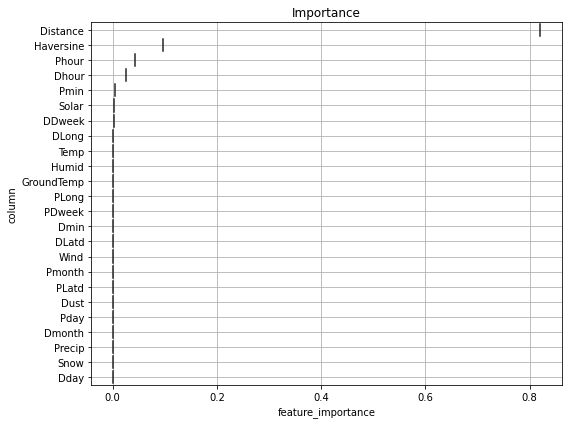

In [18]:
%%time

from sklearn.ensemble import GradientBoostingRegressor

GBR = GradientBoostingRegressor()

GBR.fit(X_train, Y_train)

print_score(GBR)

fig, ax = visualize_importance(GBR.feature_importances_, X_train)

## Decision Tree Regressor

In [19]:
%%time
from sklearn.tree import DecisionTreeRegressor

DTR = DecisionTreeRegressor()


DTR.fit(X_train, Y_train)

print_score(DTR)

RMSE-Train: 0.0
RMSE-Test: 18.791847168386614
Score-Train: 1.0
Score-Test: 0.4330344395060921
MedAE-Train: 0.0
MedAE-Test: 4.0
MeanAE-Train: 0.0
MeanAE-Test: 10.28624 

CPU times: user 2.6 s, sys: 13.8 ms, total: 2.61 s
Wall time: 2.64 s


## AdaBoostRegressor

RMSE-Train: 17.662994269759878
RMSE-Test: 17.635123361490535
Score-Train: 0.5031832696189189
Score-Test: 0.5006848543437437
MedAE-Train: 12.155237767057201
MedAE-Test: 12.401891567869988
MeanAE-Train: 14.550723611794462
MeanAE-Test: 14.57511904120911 

CPU times: user 4.53 s, sys: 86.8 ms, total: 4.61 s
Wall time: 4.61 s


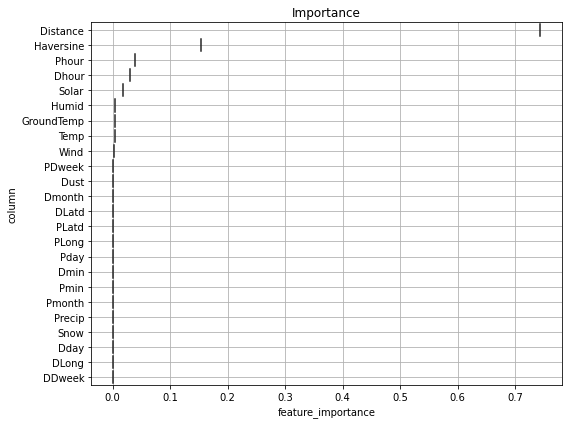

In [20]:
%%time
from sklearn.ensemble import AdaBoostRegressor

AdaBoost = AdaBoostRegressor()

AdaBoost.fit(X_train, Y_train)

print_score(AdaBoost)

fig, ax = visualize_importance(AdaBoost.feature_importances_, X_train)

## XGB Regressor

[08:25:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE-Train: 12.579206176966547
RMSE-Test: 12.716171303667121
Score-Train: 0.7480153841534516
Score-Test: 0.7403845852556956
MedAE-Train: 3.785470485687256
MedAE-Test: 3.8519887924194336
MeanAE-Train: 7.3760252154755594
MeanAE-Test: 7.458925295952558 

CPU times: user 9.11 s, sys: 104 ms, total: 9.22 s
Wall time: 9.47 s


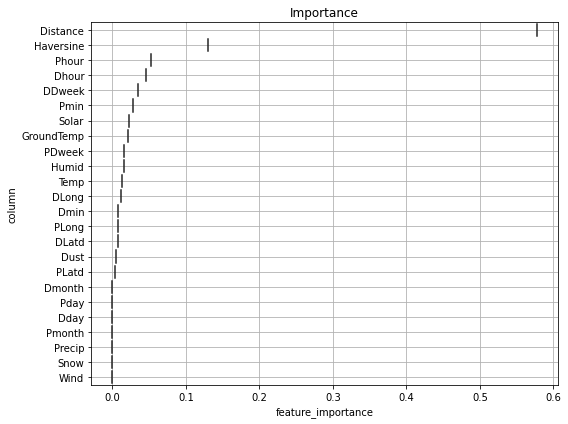

In [21]:
%%time
from xgboost import XGBRegressor

xgbr = XGBRegressor()

xgbr.fit(X_train, Y_train)


print_score(xgbr)

fig, ax = visualize_importance(xgbr.feature_importances_, X_train)

## Light Gradient Boosted Machine

RMSE-Train: 9.049703585383979
RMSE-Test: 9.545967496389812
Score-Train: 0.8695823815478029
Score-Test: 0.853695515513133
MedAE-Train: 3.0187587697890645
MedAE-Test: 3.119112966436719
MeanAE-Train: 5.462371393637222
MeanAE-Test: 5.717040741489892 

CPU times: user 3.86 s, sys: 59 ms, total: 3.92 s
Wall time: 3.96 s


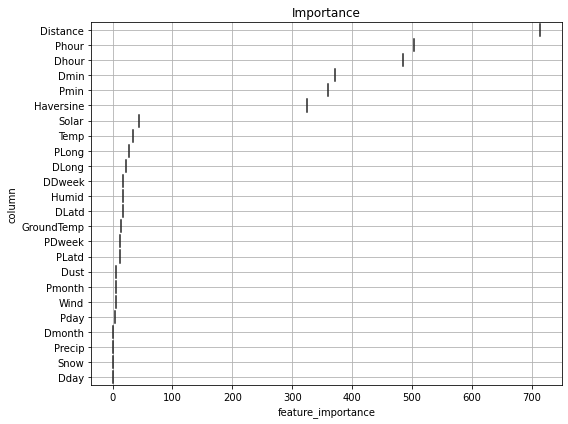

In [22]:
%%time
import lightgbm as lgbm

lg = lgbm.LGBMRegressor()

lg.fit(X_train, Y_train)

print_score(lg)

fig, ax = visualize_importance(lg.feature_importances_, X_train)

## Comparing all the model based on metric

In [23]:
# Function for comparing models metrics
def compare_models(models,names,X_train,y_train,X_test,y_test):
  import sklearn.metrics as metrics
  from sklearn.model_selection import train_test_split

  data = {'Metric':['rmse','MedAE','MAE','R-squared']}
  df_train = pd.DataFrame(data)
  df_test = pd.DataFrame(data)

  def rmse(x,y):
    return math.sqrt(((x-y)**2).mean())


  for (model,name) in zip(models,names):
    y_pred= model.predict(X_test)
    res = [rmse(model.predict(X_train), y_train),rmse(model.predict(X_test), y_test),
              metrics.median_absolute_error(model.predict(X_train), y_train),metrics.median_absolute_error(model.predict(X_test), y_test),
              metrics.mean_absolute_error(model.predict(X_train), y_train),metrics.mean_absolute_error(model.predict(X_test), y_test),
              metrics.r2_score(model.predict(X_train), y_train),metrics.r2_score(model.predict(X_test), y_test)]
  df_train[name] = [res[0], res[2], res[4], res[6]]
  df_test[name] = [res[1], res[3], res[5], res[7]]
  return df_train,df_test   

In [24]:
models= [lModel, DTR, rf, knnr, GBR, xgbr, AdaBoost]

names = ['Lr', 'Dtree', 'Forest', 'Knn', 'GBR', 'Xboost', 'AdaBoost']

comp_model_train,comp_model_test = compare_models(models,names,X_train,Y_train, X_test, Y_test)


### RMSE of all models on train and test data

In [25]:
print(comp_model_train[:1])
print('\n')
print(comp_model_test[:1])


  Metric   AdaBoost
0   rmse  17.662994


  Metric   AdaBoost
0   rmse  17.635123


### All metrics on train and test data

In [26]:
print('Results on Train data')
comp_model_train

Results on Train data


,Metric,AdaBoost
0,rmse,17.662994
1,MedAE,12.155238
2,MAE,14.550724
3,R-squared,0.007520


In [27]:
print('Results on Test data')
comp_model_test


Results on Test data


,Metric,AdaBoost
0,rmse,17.635123
1,MedAE,12.401892
2,MAE,14.575119
3,R-squared,0.007256


## Hyperparameter Tunning

## RamdomizedSearchCV

In [28]:
X_train,X_test,Y_train,Y_test=train_test_split(X[:5000],Y[:5000],test_size=0.25,random_state=123)

In [29]:
X_train.shape, X_test.shape

((3750, 24), (1250, 24))

In [30]:
# Use the random grid to search for best hyperparameters
def random_Search(model,X_train, Y_train,param_grid):
  from sklearn.model_selection import RandomizedSearchCV

  # Random search of parameters, using 3 fold cross validation, 
  # search across 100 different combinations, and use all available cores
  random = RandomizedSearchCV(estimator = model, param_distributions = param_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
  random.fit(X_train, Y_train)
  print("\n Best parameters: ",random.best_params_)

In [31]:
%%time
rf_para_grid = {'n_estimators': [int(x) for x in np.linspace(start=200, stop=400, num=3)],
               'max_features': ['auto', 'sqrt'],
               'max_depth': [int(x) for x in np.linspace(10,110, num=3)],
               'min_samples_leaf': [1,2],
               'min_samples_leaf': [2,5],
               'bootstrap': [True, False]}

random_Search(RandomForestRegressor(), X_train, Y_train, param_grid=rf_para_grid)


Fitting 3 folds for each of 72 candidates, totalling 216 fits

 Best parameters:  {'n_estimators': 300, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 110, 'bootstrap': True}
CPU times: user 16.3 s, sys: 939 ms, total: 17.2 s
Wall time: 15min 46s


In [32]:
%%time
knn_para_grid = {'leaf_size':list(range(1,20)),
                 'n_neighbors':list(range(1,30)),
                 'p':[1,2]
                 }

random_Search(KNeighborsRegressor(), X_train, Y_train, param_grid=knn_para_grid)


Fitting 3 folds for each of 100 candidates, totalling 300 fits

 Best parameters:  {'p': 1, 'n_neighbors': 29, 'leaf_size': 19}
CPU times: user 1.19 s, sys: 100 ms, total: 1.29 s
Wall time: 28.9 s


In [36]:
%%time
Ada_para_grid = {'n_estimators':[10,50,100],
                 'learning_rate':[0.0001, 0.001, 0.01],
                 }

random_Search(AdaBoostRegressor(), X_train, Y_train, param_grid=Ada_para_grid)



Fitting 3 folds for each of 9 candidates, totalling 27 fits

 Best parameters:  {'n_estimators': 100, 'learning_rate': 0.01}
CPU times: user 1.89 s, sys: 39.9 ms, total: 1.93 s
Wall time: 14.4 s


In [35]:
%%time
XGB_para_grid = {
    "learning_rate"    : [0.05, 0.10, 0.15] ,
 "max_depth"        : [3,4,5],
 "min_child_weight" : [1,3],
 "gamma"            : [0.0, 0.1],
 "colsample_bytree" : [0.3, 0.4] 
 }

random_Search(XGBRegressor(), X_train, Y_train, param_grid=XGB_para_grid)



Fitting 3 folds for each of 72 candidates, totalling 216 fits
[09:18:01] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

 Best parameters:  {'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.15, 'gamma': 0.0, 'colsample_bytree': 0.4}
CPU times: user 1.99 s, sys: 260 ms, total: 2.25 s
Wall time: 46.9 s


In [37]:
GBR_para_grid = {
'n_estimators':  [10,50,100], 
 'learning_rate' : [0.1,0.2],
 'max_depth': [x for x in range(5,8)], 
 'min_samples_split': [x for x in range(2,6)]
}

random_Search(GradientBoostingRegressor(), X_train, Y_train, param_grid=GBR_para_grid)


Fitting 3 folds for each of 72 candidates, totalling 216 fits

 Best parameters:  {'n_estimators': 100, 'min_samples_split': 5, 'max_depth': 5, 'learning_rate': 0.2}


## Using best hyperparameters

In [38]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.25,random_state=123)
X_train.shape,X_test.shape,Y_train.shape,Y_test.shape

((75000, 24), (25000, 24), (75000,), (25000,))

## RandomForest Model

RMSE-Train: 8.734471682986214
RMSE-Test: 12.982027680605785
Score-Train: 0.8785099142352906
Score-Test: 0.7294155734177894
MedAE-Train: 2.1172703327589213
MedAE-Test: 3.5116014195284775
MeanAE-Train: 4.64104135992283
MeanAE-Test: 7.369337878842277 

CPU times: user 6min 41s, sys: 922 ms, total: 6min 42s
Wall time: 6min 54s


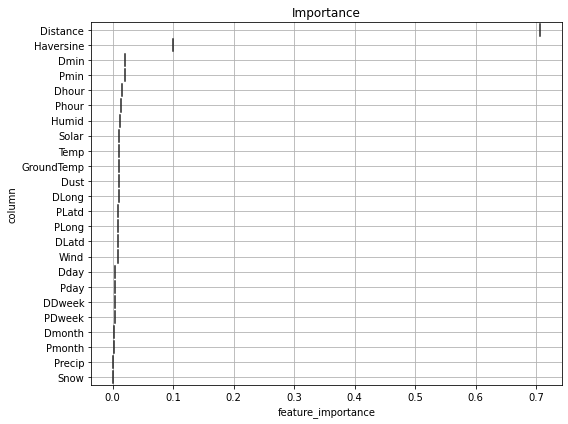

In [39]:
%%time

from sklearn.ensemble import RandomForestRegressor

rf= RandomForestRegressor(**{'n_estimators': 300, 'min_samples_leaf': 5, 'max_features': 'auto', 'max_depth': 110, 'bootstrap': True})

rf.fit(X_train, Y_train)

print_score(rf)

fig, ax = visualize_importance(rf.feature_importances_, X_train)

## KNN Regressor

In [40]:
%%time
from sklearn.neighbors import KNeighborsRegressor

knnr = KNeighborsRegressor(**{'p': 1, 'n_neighbors': 29, 'leaf_size': 19})

knnr.fit(X_train, Y_train)

print_score(knnr)

RMSE-Train: 14.741590479901767
RMSE-Test: 15.241102737387648
Score-Train: 0.6539361452545966
Score-Test: 0.6270500812870244
MedAE-Train: 4.413793103448276
MedAE-Test: 4.586206896551722
MeanAE-Train: 8.386442758620689
MeanAE-Test: 8.71414344827586 

CPU times: user 23min 5s, sys: 14.2 s, total: 23min 19s
Wall time: 23min 23s


## Adaboost Regressor

RMSE-Train: 15.144141025395593
RMSE-Test: 15.119637361165127
Score-Train: 0.6347780703839964
Score-Test: 0.6329709112555075
MedAE-Train: 5.856999999999999
MedAE-Test: 5.856999999999999
MeanAE-Train: 9.56060881104348
MeanAE-Test: 9.579410391922726 

CPU times: user 40 s, sys: 565 ms, total: 40.5 s
Wall time: 40.5 s


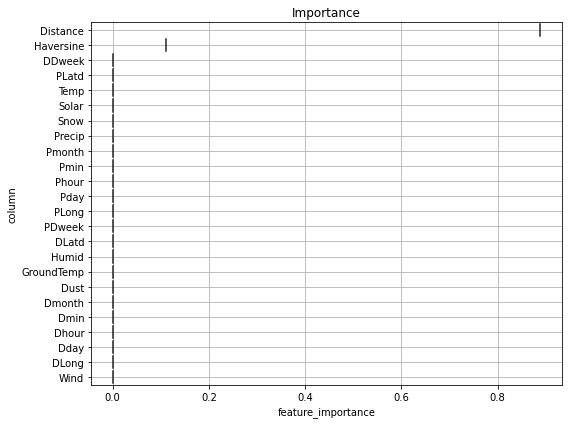

In [41]:
%%time

from sklearn.ensemble import AdaBoostRegressor

AdaBoost = AdaBoostRegressor(**{'n_estimators': 100, 'learning_rate': 0.01})

AdaBoost.fit(X_train, Y_train)

print_score(AdaBoost)

fig, ax = visualize_importance(AdaBoost.feature_importances_, X_train)


## XGBoost Regressor

[09:57:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE-Train: 10.97223066603429
RMSE-Test: 11.495572162162327
Score-Train: 0.8082844170704608
Score-Test: 0.787832470377803
MedAE-Train: 3.497882843017578
MedAE-Test: 3.6479666233062744
MeanAE-Train: 6.439180413986842
MeanAE-Test: 6.750820257514715 

CPU times: user 8.72 s, sys: 61 ms, total: 8.78 s
Wall time: 9.03 s


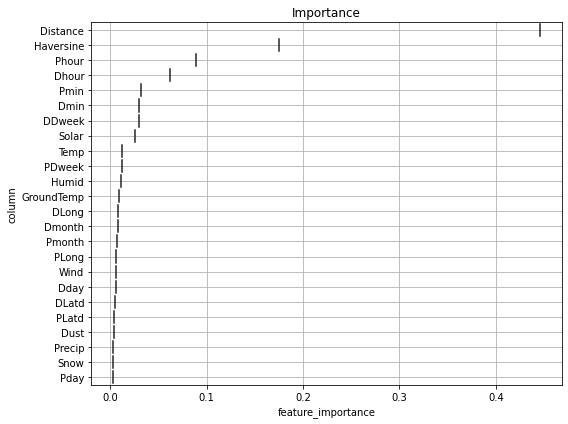

In [42]:
%%time
from xgboost import XGBRegressor

xgbr = XGBRegressor(**{'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 0.15, 'gamma': 0.0, 'colsample_bytree': 0.4})

xgbr.fit(X_train, Y_train)


print_score(xgbr)

fig, ax = visualize_importance(xgbr.feature_importances_, X_train)


RMSE-Train: 12.565695612597242
RMSE-Test: 12.709417342317192
Score-Train: 0.7485563763377527
Score-Test: 0.7406602919575642
MedAE-Train: 3.7933676282440985
MedAE-Test: 3.859636318642351
MeanAE-Train: 7.373782017727069
MeanAE-Test: 7.466109388825658 

CPU times: user 29.6 s, sys: 65.7 ms, total: 29.6 s
Wall time: 29.6 s


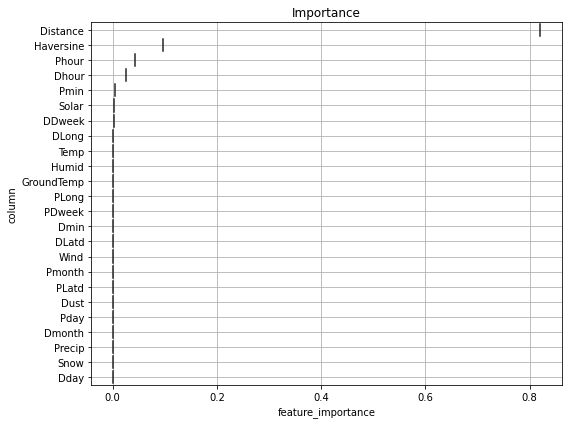

In [43]:
%%time
from sklearn.ensemble import GradientBoostingRegressor

GBR = GradientBoostingRegressor()

GBR.fit(X_train, Y_train)

print_score(GBR)

fig, ax = visualize_importance(GBR.feature_importances_, X_train)


In [44]:
models= [rf, knnr, GBR, xgbr, AdaBoost]

names = ['Forest', 'Knn', 'GBR', 'Xboost', 'AdaBoost']

comp_model_train,comp_model_test = compare_models(models,names,X_train,Y_train, X_test, Y_test)


In [45]:
print('Results on Train data')
comp_model_train

Results on Train data


,Metric,AdaBoost
0,rmse,15.144141
1,MedAE,5.857000
2,MAE,9.560609
3,R-squared,0.404022


In [46]:
print('Results on Test data')
comp_model_test

Results on Test data


,Metric,AdaBoost
0,rmse,15.119637
1,MedAE,5.857000
2,MAE,9.579410
3,R-squared,0.406852


## CONCLUSION
Out of all the columns in the dataset, Distance is the most important feature of them all and after Hyperparameter Tuning Adaboost Regressor performed much better when compared to remaining models.
